In [217]:
from pororo import Pororo
import pymysql

In [218]:
db = pymysql.connect(
    user='web_user',
    passwd='cau523.',
    port=3308,
    host='165.194.104.225',
    db='movie_annotation',
    charset='utf8'
)

In [219]:
cursor = db.cursor(pymysql.cursors.DictCursor)

In [220]:
cursor.execute("select speaker, speech, listener, movie_name from movie_script_annotation where movie_name = '8월의 크리스마스' or movie_name = '각설탕' or movie_name = '고지전' or movie_name = '괴물' or movie_name = '남극일기' or movie_name = '다찌마와 Lee' or movie_name = '올드보이' or movie_name = '내 머리 속의 지우개' or movie_name = '가족'")

2992

In [221]:
data = cursor.fetchall()

In [222]:
data

[{'speaker': '다림',
  'speech': '번호판이 하나도 한 보이네.',
  'listener': 'self',
  'movie_name': '8월의 크리스마스'},
 {'speaker': '다림',
  'speech': '왜 웃어요?',
  'listener': '정원',
  'movie_name': '8월의 크리스마스'},
 {'speaker': '다림',
  'speech': '이상하다. 잘 찍었는데, 아저씨가 잘못한 거 아녜요?',
  'listener': '정원',
  'movie_name': '8월의 크리스마스'},
 {'speaker': '다림',
  'speech': '할 수 없죠 뭐. 아저씨 필름 좀 넣어 주세요.',
  'listener': '정원',
  'movie_name': '8월의 크리스마스'},
 {'speaker': '정원',
  'speech': '필름을 넣을 줄 몰라요 ?',
  'listener': '다림',
  'movie_name': '8월의 크리스마스'},
 {'speaker': '다림',
  'speech': '좀 해주세요.',
  'listener': '정원',
  'movie_name': '8월의 크리스마스'},
 {'speaker': '정원',
  'speech': '이리 와봐요. 가르쳐 줄테니 잘 들어요',
  'listener': '다림',
  'movie_name': '8월의 크리스마스'},
 {'speaker': '정원',
  'speech': '설명은 듣지 않고.. 아가씨, 셔터 누를 때 숨을 멈춰.',
  'listener': '다림',
  'movie_name': '8월의 크리스마스'},
 {'speaker': '정원',
  'speech': '여기서 뭐해요?\n',
  'listener': '다림',
  'movie_name': '8월의 크리스마스'},
 {'speaker': '정원',
  'speech': '너무 젊었을 때 사진을 썼나 ?',
  'listener': '철구',
  

In [223]:
import pickle

In [224]:
with open("data.pickle","wb") as fw:
    pickle.dump(data, fw)

In [143]:
for i in data:
    i['speech'] = i['speech'].strip()
    if ("(",")" in i['speech']):
        indices = list(range(i['speech'].find("("), i['speech'].find(")") +1))
        a = [x for j, x in enumerate(i['speech']) if j not in indices]
        i['speech'] = ''.join(a)

In [144]:
for i in data:
    if "(" in i['speech']:
        print(i)

In [145]:
new_data = []

for i in data:
    if i['speaker'] == "Character":
        continue
#     if '(o.s)' in i['listener']:
#         i['listener'] = i['listener'][:i['listener'].index('(')]
    if "/" not in i['listener']:
        new_data.append(i)
    if "/" in i['listener']:
        a = i['listener']
        slash_count = i['listener'].count("/")
        e = []
        for x in range(slash_count + 1):
            if "/" in a:
                z = a[:a.index('/')]
                a = a[a.index('/')+1:]
                e.append(z)
            else:
                z = a
                e.append(z)
        for j in e:
            new_data.append({'speaker': i['speaker'], 'speech': i['speech'], 'listener': j, 'movie_name': i['movie_name']})

In [146]:
for i in data:
    print(i)

{'speaker': '다림', 'speech': '번호판이 하나도 한 보이네.', 'listener': 'self', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '왜 웃어요?', 'listener': '정원', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '이상하다. 잘 찍었는데, 아저씨가 잘못한 거 아녜요?', 'listener': '정원', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '할 수 없죠 뭐. 아저씨 필름 좀 넣어 주세요.', 'listener': '정원', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '필름을 넣을 줄 몰라요 ?', 'listener': '다림', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '좀 해주세요.', 'listener': '정원', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '이리 와봐요. 가르쳐 줄테니 잘 들어요', 'listener': '다림', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '설명은 듣지 않고.. 아가씨, 셔터 누를 때 숨을 멈춰.', 'listener': '다림', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '여기서 뭐해요?', 'listener': '다림', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '너무 젊었을 때 사진을 썼나 ?', 'listener': '철구', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '한참 기다렸어요.', 'listener': '

In [147]:
for i in new_data:
    print(i)

{'speaker': '다림', 'speech': '번호판이 하나도 한 보이네.', 'listener': 'self', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '왜 웃어요?', 'listener': '정원', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '이상하다. 잘 찍었는데, 아저씨가 잘못한 거 아녜요?', 'listener': '정원', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '할 수 없죠 뭐. 아저씨 필름 좀 넣어 주세요.', 'listener': '정원', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '필름을 넣을 줄 몰라요 ?', 'listener': '다림', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '좀 해주세요.', 'listener': '정원', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '이리 와봐요. 가르쳐 줄테니 잘 들어요', 'listener': '다림', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '설명은 듣지 않고.. 아가씨, 셔터 누를 때 숨을 멈춰.', 'listener': '다림', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '여기서 뭐해요?', 'listener': '다림', 'movie_name': '8월의 크리스마스'}
{'speaker': '정원', 'speech': '너무 젊었을 때 사진을 썼나 ?', 'listener': '철구', 'movie_name': '8월의 크리스마스'}
{'speaker': '다림', 'speech': '한참 기다렸어요.', 'listener': '

In [148]:
ext_data = {}

for i in new_data:
    if i['speaker'] + '_' + i['listener'] + '_' + i['movie_name'] in ext_data:
        ext_data[i['speaker'] + '_' + i['listener'] + '_' + i['movie_name']] += i['speech']
    if i['speaker'] + '_' + i['listener'] + '_' + i['movie_name'] not in ext_data:
        ext_data[i['speaker'] + '_' + i['listener'] + '_' + i['movie_name']] = i['speech']

In [149]:
ext_data

{'다림_self_8월의 크리스마스': '번호판이 하나도 한 보이네.',
 '다림_정원_8월의 크리스마스': '왜 웃어요?이상하다. 잘 찍었는데, 아저씨가 잘못한 거 아녜요?할 수 없죠 뭐. 아저씨 필름 좀 넣어 주세요.좀 해주세요.한참 기다렸어요.이거 급한거니까 빨리 찾아오래요. 얼마나 걸려요 ?아침부터 혼나고, 너무 더워서 그래요.더운건 정말 싫어요이번 사진은 어떻게 나올지..걱정된다. 이번에도 촛점이 안맞으면 그건 내 잘못 아니예요 아저씨 잘못이지어른이나 애들이나 남자들은 왜 그래요?아저씨는 그런 것도 해 줘요?이 사진들 다 아저씨가 찍은 거예요?이 사진은요?나랑 비슷하시네.이런 사진찍기는 굉장히 힘들 것 같은데 .. 이제보니 사진작가구나아저씨는...아저씨가 쓰는 카메라 얼마쯤 해요 ?있잖아요. 노란 끈 달리고 사진기 앞에 대포처럼 튀어나온거 그런거 하나 살 생각이예요그냥요.. 그런거 가지고 다니면서 단속하면 사람들이 무시 못할꺼예요좀 쉬었다 가도 돼죠 ? 더운건 이제 지겨워요사자자리죠 ?생일이 팔월 아니에요? 사자자리가 나랑 잘 맞는데... 근데 아저씨 몇 살이에요?삼십대구나?  그렇게 말하는 거 보니까. 완전히 아저씨네 결혼은 아직 안했죠?아저씨 옷 입는 거 보면 알아요. 거짓말 마세요. 사귀는 여자도 없죠?어린 것이라뇨. 기분나빠. 나 이제부터 십분만 잘테니까 말시키지 마요그런데 아저씨, 왜 오늘은 반말해요.?아저씨. 어디가요?숙녀가 이렇게 무거운 걸 들고 가야 되겠어요?예.복수하려고 했는데.. 또 당했네.어지럽다면서 이젠 괞찬아요?  이것도 아저씨 마시세요.아무말도 안하고요?난 아직 연애 한번 제대로 못해 봤는데.다들 시시해요.모르죠. 어느 세월에.아저씨, 이거 오늘 꼭 맡겨야 돼요.안돼요. 급한거예요.안돼요. 거기는 가기 싫어요. 아저씨..아저씨. 아이스크림 안 좋아해요?아저씨 외아들이죠.형제가 많은 집에서 자란 사람은 먹는 거 보고 알아요. 우리집은 아이스크림 하나 먹으려면 전쟁을 해야 되요. 나하고 막내동생은 늘 죽자사자 해야 겨우 얻어먹었어

In [150]:
se = Pororo(task="sentence_embedding", lang="ko")

In [151]:
ext_data_keys = []
for i in ext_data.keys():
    ext_data_keys.append(i)

In [152]:
ext_data_keys

['다림_self_8월의 크리스마스',
 '다림_정원_8월의 크리스마스',
 '정원_다림_8월의 크리스마스',
 '정원_철구_8월의 크리스마스',
 '정원_중학생들_8월의 크리스마스',
 '정원_중학생 3_8월의 크리스마스',
 '정원_석희_8월의 크리스마스',
 '정원_정숙_8월의 크리스마스',
 '정원_아버지_8월의 크리스마스',
 '정원_지원_8월의 크리스마스',
 '정원_뚱뚱한 30대 여자_8월의 크리스마스',
 '정원_경찰관_8월의 크리스마스',
 '정원_술취한 남자_8월의 크리스마스',
 '강은표_김수혁_고지전',
 '김수혁_강은표_고지전',
 '김수혁_인민군_고지전',
 '김수혁_현정윤_고지전',
 '강은표_초병_고지전',
 '강은표_위병_고지전',
 '강은표_남성식_고지전',
 '강은표_최대령_고지전',
 '강은표_신일영_고지전',
 '김수혁_임소령_고지전',
 '강은표_유재홍_고지전',
 '강은표_self_고지전',
 '김수혁_유재홍_고지전',
 '강은표_양효삼_고지전',
 '김수혁_self_고지전',
 '김수혁_김수혁_고지전',
 '김수혁_전원_고지전',
 '다림_철이_8월의 크리스마스',
 '다림_효정_8월의 크리스마스',
 '정원_할머니_8월의 크리스마스',
 '정원_self_8월의 크리스마스',
 '정원_민구_8월의 크리스마스',
 '정원_정원아버지_8월의 크리스마스',
 '정원_권투선수청년_8월의 크리스마스',
 '희봉_self_괴물',
 '강두_self_괴물',
 '희봉_강두_괴물',
 '강두_희봉_괴물',
 '강두_현서_괴물',
 '현서_강두_괴물',
 '민재_self_남극일기',
 '민재_도형_남극일기',
 '도형_근찬_남극일기',
 '도형_영민_남극일기',
 '도형_재경_남극일기',
 '도형_성훈_남극일기',
 '민재_유진_남극일기',
 '민재_근찬_남극일기',
 '민재_영민_남극일기',
 '민재_재경_남극일기',
 '민재_성훈_남극일기',
 '도형_민재_남극일기',
 '도형_self_남극일기',
 '희봉_현서_괴물',
 '현서

In [153]:
data2 = {}
for i in ext_data:
    data2[i]=se(ext_data[i])

In [111]:
data2

{'다림_self_8월의 크리스마스': array([ 1.41377240e-01, -2.09096000e-01, -6.79766834e-01,  1.30394071e-01,
         3.83825079e-02,  2.77106225e-01,  4.13754806e-02,  9.97876376e-02,
         3.88418287e-02,  2.45221645e-01, -1.89178377e-01,  4.50462140e-02,
         1.30649954e-01,  1.63011745e-01,  5.69559410e-02,  9.43544973e-03,
         1.85253710e-01, -1.76551133e-01, -9.09773260e-02, -1.13251852e-02,
         8.20833594e-02, -4.36398685e-01,  2.84012370e-02, -1.02204800e-01,
         3.57437991e-02,  1.09706260e-01,  1.24856271e-01, -3.02672148e-01,
        -3.03053707e-01, -1.65262610e-01, -3.51326704e-01, -7.80043900e-02,
        -1.43258125e-01, -1.52227551e-01,  1.32527024e-01,  4.02007520e-01,
         1.86829716e-02,  9.59159527e-03,  1.38341337e-01, -3.11971128e-01,
         3.51840675e-01, -1.44119963e-01,  1.07516132e-01,  5.07347211e-02,
        -1.17662944e-01,  6.13851734e-02, -4.35785383e-01,  1.73558984e-02,
        -7.89911300e-02,  4.45569977e-02, -2.11631805e-02,  9.61366

In [88]:
vec_list = []
for i in data2:
    vec_list.append(i)

In [89]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

In [90]:
xys = pca.fit_transform(vec_list)

In [35]:
for i in ext_data:
    ext_data[i] = pca.fit_transform(ext_data[i])

ValueError: Expected 2D array, got 1D array instead:
array=[ 1.41377240e-01 -2.09096000e-01 -6.79766834e-01  1.30394071e-01
  3.83825079e-02  2.77106225e-01  4.13754806e-02  9.97876376e-02
  3.88418287e-02  2.45221645e-01 -1.89178377e-01  4.50462140e-02
  1.30649954e-01  1.63011745e-01  5.69559410e-02  9.43544973e-03
  1.85253710e-01 -1.76551133e-01 -9.09773260e-02 -1.13251852e-02
  8.20833594e-02 -4.36398685e-01  2.84012370e-02 -1.02204800e-01
  3.57437991e-02  1.09706260e-01  1.24856271e-01 -3.02672148e-01
 -3.03053707e-01 -1.65262610e-01 -3.51326704e-01 -7.80043900e-02
 -1.43258125e-01 -1.52227551e-01  1.32527024e-01  4.02007520e-01
  1.86829716e-02  9.59159527e-03  1.38341337e-01 -3.11971128e-01
  3.51840675e-01 -1.44119963e-01  1.07516132e-01  5.07347211e-02
 -1.17662944e-01  6.13851734e-02 -4.35785383e-01  1.73558984e-02
 -7.89911300e-02  4.45569977e-02 -2.11631805e-02  9.61366370e-02
  1.30640909e-01  2.14072376e-01 -2.59474993e-01 -9.81575847e-02
 -8.52573216e-02 -2.35439613e-01  2.97168875e-03  2.22619057e-01
 -7.63934944e-03 -3.70065719e-01  1.83297604e-01 -8.83909315e-02
  3.43650356e-02  5.36282770e-02 -2.05816180e-01 -1.64754599e-01
  2.51290619e-01 -6.42904490e-02 -3.38706672e-01 -2.83362746e-01
 -1.23331353e-01 -2.34622270e-01 -3.42330873e-01  2.03644633e-01
 -9.17567760e-02  4.50852737e-02  5.29020913e-02 -1.15105910e-02
 -1.12703480e-01 -1.20880842e-01  3.43723983e-01 -1.27175553e-02
 -3.58575396e-02 -2.82640934e-01  1.62922978e-01  1.23400509e-01
  9.42246169e-02 -2.01174423e-01 -2.07340389e-01 -2.72826970e-01
  9.25379872e-01 -3.75895709e-01 -2.04193443e-01  2.21916642e-02
 -4.71176058e-01  6.03478141e-02 -1.89244777e-01  1.25976413e-01
 -1.34189829e-01  5.85584249e-03 -3.82163703e-01 -2.17484906e-01
  1.36291891e-01 -6.85494021e-02  9.27223414e-02 -1.31061926e-01
  7.80692473e-02  2.82358259e-01 -2.11801618e-01  6.54555187e-02
  5.41848600e-01  2.27910608e-01  3.83601263e-02 -1.38063967e-01
 -5.70039526e-02 -7.44167417e-02 -3.15377256e-03 -9.10654664e-02
 -3.55483770e-01 -2.34027440e-03  1.37371153e-01  6.38130456e-02
 -3.59844744e-01 -4.87415016e-01  3.31632942e-02  1.38272926e-01
 -1.36143655e-01  9.10703912e-02  3.09121311e-02  2.47759447e-02
 -2.51594573e-01 -1.15526557e-01  1.00156404e-01 -5.45448847e-02
 -7.77026415e-02  3.52378428e-01 -1.22802317e-01  1.94863081e-01
  6.96423277e-02 -3.96170318e-01 -2.73273706e-01 -1.34569180e+00
 -9.08607710e-03  1.12204030e-01  1.33505642e-01  1.12040460e-01
 -8.41296911e-02 -2.06324369e-01 -2.51568317e-01 -1.21262647e-01
  1.56419456e-01 -3.97699401e-02 -1.00159310e-01 -1.14031360e-01
  3.45608816e-02 -1.82232052e-01 -6.11974709e-02  1.79599494e-01
  1.26427561e-01  3.81927401e-01 -7.71643519e-01 -5.36737218e-02
  1.60748791e-02 -2.36231759e-01 -7.15753948e-03 -2.77963489e-01
 -1.82122722e-01 -1.72310784e-01  4.50000525e-01  2.46858403e-01
  4.40551154e-02 -3.40948522e-01  4.32688087e-01 -1.59950942e-01
 -1.33966953e-01 -2.02164292e-01 -1.65247604e-01  1.03351630e-01
 -1.10420547e-01 -4.74570900e-01  1.16592482e-01 -3.35635757e-03
 -2.96360757e-02  8.70423913e-02 -1.40075656e-02 -1.49181783e-01
  6.14534989e-02 -1.98137403e-01  3.63964617e-01 -1.80124000e-01
  2.64875237e-02 -2.78753102e-01 -1.50840461e-01 -1.72169298e-01
 -4.83375303e-02  2.49969646e-01  8.11837837e-02 -4.66815621e-01
 -1.96674258e-01  3.21852505e-01  9.36864167e-02  3.35910410e-01
  2.83190250e-01  5.40666562e-03 -2.61964709e-01 -5.30937733e-03
  4.16464806e-02 -3.93959224e-01  7.23842829e-02 -2.93629408e-01
 -9.49427113e-02 -9.51782167e-02 -5.49939163e-02  2.23499779e-02
  9.18438006e-03  4.13988624e-03  2.85368669e-03 -1.55720413e-01
 -3.28655928e-01 -6.94488436e-02 -2.36709028e-01  8.37617517e-02
 -3.15308094e-01  2.27272272e-01  3.90253542e-03 -7.16033801e-02
  3.03514808e-01  7.09606037e-02 -1.57993600e-01  2.23797321e-01
 -1.40253887e-01  8.71196017e-02 -5.02330884e-02  1.61547765e-01
 -4.59824875e-02 -9.64224432e-03  4.78075668e-02 -1.53087407e-01
  1.12094365e-01 -2.78858066e-01 -1.92093134e-01  2.45415457e-02
 -1.86829537e-01 -1.89187482e-01 -1.42363220e-01  2.53989641e-02
  2.48991638e-01  3.61995786e-01 -9.30165872e-02  9.42399278e-02
 -1.12207517e-01 -9.41224992e-02  2.52298057e-01  2.09134191e-01
 -1.23570465e-01 -5.37827127e-02 -1.16419993e-01 -2.65217692e-01
  1.54204696e-01  3.33158821e-01 -1.52249426e-01 -4.82734330e-02
  7.25933239e-02 -3.71984616e-02  6.06524408e-01 -3.16086948e-01
  1.93934366e-01 -1.06349863e-01  6.92179650e-02 -1.52910769e-01
 -2.83117890e-02 -6.25565872e-02 -9.82186049e-02  2.30267838e-01
 -4.28993315e-01  1.63180560e-01 -4.31326151e-01 -5.06095216e-02
 -2.46502832e-01 -3.89551073e-02  1.62937254e-01 -2.05670688e-02
  3.63800824e-01 -1.62154824e-01  3.92209947e-01  4.48387936e-02
  5.84255345e-02  6.24547116e-02  1.65118173e-01 -2.29116291e-01
  8.28779787e-02 -1.92210749e-01 -3.57978433e-01  6.44380003e-02
  4.15723026e-01  2.59450413e-02 -1.87632516e-01  9.98814255e-02
  4.03405577e-01  5.80671206e-02  4.62922342e-02  4.25210074e-02
 -2.80486733e-01 -1.69859439e-01 -1.34130046e-02  3.18641812e-01
  8.83362666e-02 -2.28019997e-01  5.02704561e-01 -3.89362499e-03
  1.53262109e-01 -3.39822441e-01  2.77535439e-01 -2.79808223e-01
 -4.40212572e-03 -3.84011686e-01 -1.56754613e-01 -4.46598709e-01
  6.85967356e-02  2.05153108e-01  1.99117631e-01 -1.63239509e-01
 -4.65909421e-01  2.35179216e-01  1.32509500e-01 -8.41907710e-02
  3.61419320e-02  5.98883256e-02 -1.13800421e-01  1.31414145e-01
  6.83392286e-02 -1.08645238e-01  5.45683086e-01 -1.31586775e-01
  2.02896595e-01  6.32460713e-01 -6.48906231e-02  1.96792513e-01
 -4.38189805e-01 -1.30966380e-01 -1.50693685e-01 -7.10208435e-03
 -1.37043148e-01 -1.69034246e-02  1.10975688e-03 -1.34624960e-02
  1.49022192e-01 -1.05099842e-01 -1.27179757e-01  5.04350364e-02
  1.63156629e-01  2.24305585e-01 -6.49398193e-02  3.92801762e-01
  7.53725618e-02  3.00742686e-01  2.08867311e-01 -1.68193132e-01
 -1.85002178e-01 -5.62768467e-02 -1.10434983e-02 -2.69648135e-01
  5.62514842e-01 -1.95307553e-01 -6.27574503e-01 -1.14301324e-01
  3.77171263e-02  1.68110579e-01  1.08372316e-01 -2.42640615e-01
 -6.05745912e-02 -2.19078541e-01 -2.91703165e-01 -1.66987311e-02
  1.33487493e-01  2.21946210e-01  2.07914069e-01 -1.45867258e-01
 -4.05015707e-01  2.63072141e-02  8.13001543e-02 -5.33308983e-02
 -1.62264556e-01 -2.11305410e-01  1.38141932e-02 -6.31840602e-02
 -2.38581300e-01  4.22805026e-02 -1.34374499e-01 -1.08375192e-01
 -3.66824389e-01 -3.06208245e-02  2.05692768e-01 -1.06489733e-01
  6.68198541e-02  3.02286118e-01  4.48784262e-01 -1.41961593e-02
 -1.01232659e-02 -1.33661240e-01  1.92765892e-01  4.60884087e-02
 -6.42075995e-03 -2.09757984e-02  3.18270698e-02 -2.97521561e-01
 -1.88870579e-02  1.43749014e-01 -3.09750915e-01  6.26409501e-02
  3.77514780e-01 -1.66340902e-01 -1.72736317e-01 -2.21991092e-01
 -2.26671427e-01  1.64165050e-01  1.61154658e-01 -1.22297276e-02
  5.21845460e-01  7.26371855e-02  5.90539202e-02 -1.52528003e-01
 -3.34265642e-02 -1.10987842e-01  3.50809366e-01  5.57906553e-02
 -1.76315650e-01  2.13590190e-02 -1.67509764e-01  2.01187938e-01
  1.12406746e-01  2.43383199e-01  4.33976315e-02 -1.41592652e-01
  5.31953946e-03 -1.69252723e-01 -7.28535354e-02  4.54030424e-01
 -2.72537563e-02 -3.08873087e-01 -7.13549182e-02 -3.82222414e-01
  1.32880896e-01 -1.67322665e-01 -1.25919744e-01 -3.97652268e-01
 -1.92426875e-01  5.64216748e-02 -2.26225965e-02  1.20080031e-01
  1.16083004e-01  6.58701777e-01  1.83752015e-01 -1.15021631e-01
 -2.22622398e-02 -1.30073428e-01 -2.40489870e-01  4.95132664e-03
  2.10438743e-02  2.56088674e-01 -2.69279424e-02  6.34268895e-02
  1.36228174e-01  1.29495889e-01  9.40054208e-02 -5.70667759e-02
  2.27775183e-02  3.53128910e-01 -3.27742487e-01 -1.86954021e-01
  4.99435365e-02 -1.17379226e-01  2.75472611e-01 -2.43500352e-01
 -5.64527154e-01  1.48224324e-01  7.59659111e-02  7.46975392e-02
  5.19364700e-02  3.43306154e-01 -6.59138858e-02 -5.12967892e-02
 -1.72627926e-01  2.86907121e-03  1.51870504e-01  2.00013682e-01
 -3.98568325e-02 -9.25371647e-02 -1.60165355e-01 -1.07295416e-01
 -1.65966719e-01  3.41994286e-01  7.96334371e-02  3.03413808e-01
 -2.69791812e-01  9.97543037e-02 -1.36762023e-01  8.35447460e-02
 -1.55140040e-02 -1.24032341e-01 -8.62613916e-02  3.77547920e-01
  1.02217123e-01 -2.60656357e-01 -1.28448218e-01  4.99736145e-02
  1.04760602e-01  5.82658768e-01  3.75981331e-02 -1.84982214e-02
 -2.12163165e-01  4.52509224e-01 -1.20918989e-01 -6.43506646e-01
 -2.19276547e-01 -1.76161174e-02 -2.91953743e-01 -5.53874485e-02
 -3.50016385e-01  3.08439825e-02 -4.77508716e-02  4.41105992e-01
 -2.30443805e-01 -3.26496422e-01 -2.53500134e-01 -5.81071302e-02
  1.29380524e-01  2.99237788e-01  2.63482422e-01 -8.48153234e-02
  5.75820446e-01 -8.96749273e-02  8.76486301e-02 -2.28839636e-01
  1.58181638e-01 -2.76394874e-01 -2.45577954e-02  1.37570679e-01
  8.46027508e-02  1.14270553e-01  2.76417404e-01 -2.62990415e-01
  2.15222184e-02 -1.02002978e-01 -7.68433213e-02  3.66331115e-02
 -9.06270593e-02  1.37418510e-05  1.86208397e-01 -1.16956040e-01
  4.09304388e-02 -5.47596812e-02  1.48704007e-01  2.04481691e-01
 -3.62164415e-02 -1.80205196e-01 -3.29118550e-01 -1.58552215e-01
  2.03561023e-01 -3.44680279e-01  1.92982033e-01 -5.14268219e-01
  1.35516375e-02 -1.94363445e-02 -1.12917818e-01  2.44344041e-01
 -4.16948795e-02 -3.02131511e-02  2.41175175e-01  3.11236680e-02
 -9.93283391e-02 -6.66887015e-02 -1.50164962e-01  1.51969731e-01
  4.64680567e-02 -1.42582203e-03 -2.52392799e-01 -9.42012221e-02
 -6.11022525e-02  8.07859469e-03 -1.89838469e-01  1.97031107e-02
 -3.48786265e-01 -9.48182717e-02  2.44647525e-02 -1.60728365e-01
 -1.33227974e-01  1.61543921e-01  2.96725690e-01  1.25297397e-01
  2.02066805e-02 -2.51142025e-01  1.44845992e-01  2.78251261e-01
  9.85942483e-02  3.32121432e-01 -1.16811708e-01  6.57105222e-02
 -1.70573965e-01 -7.65350685e-02 -1.85822338e-01 -1.80744857e-01
 -4.57117669e-02  4.89238463e-02 -1.01180114e-01 -1.33043647e-01
  4.31650877e-01  1.90955549e-02  6.11825213e-02 -1.45344004e-01
  1.35899708e-01  8.44371617e-02 -1.74383059e-01  2.03545541e-01
  1.93405822e-02 -7.92072788e-02 -1.78701535e-01  1.63494796e-01
  1.13835230e-01 -5.81310317e-02 -7.58169740e-02  7.70043135e-02
  1.79034472e-03  2.94326633e-01  1.92789882e-02  9.88993868e-02
  2.10952491e-01 -2.61099815e-01  1.36425048e-01 -3.39102685e-01
  5.80761842e-02  3.94641250e-01 -3.28029208e-02 -4.49426800e-01
 -2.58684635e-01  1.59085917e-04  9.38795209e-02  1.42913252e-01
 -1.03903987e-01  4.83185649e-02 -1.29568979e-01  2.62547821e-01
  2.15058140e-02  1.08921811e-01  3.71302247e-01 -3.25400174e-01
 -4.11254704e-01  1.79043189e-01  2.82512486e-01 -3.36625755e-01
 -8.80236998e-02 -3.53030175e-01  9.15153027e-02 -2.00405687e-01
 -2.40170568e-01 -1.72491997e-01 -6.56526238e-02  2.09878653e-01
 -6.69232979e-02  2.84517288e-01  6.25406876e-02 -3.31370801e-01
 -1.02701887e-01 -4.71772850e-01  4.93407156e-03  1.30673140e-01
  3.44777107e-01 -2.98721492e-01  1.63949415e-01 -9.80166867e-02
  8.72412696e-02 -1.82535142e-01 -3.35267246e-01 -1.70535713e-01
  3.20144072e-02  3.19770584e-03  3.77443433e-01  3.40406239e-01
 -1.52394623e-01 -8.85382965e-02 -3.16655673e-02 -3.91291864e-02
 -1.59405977e-01  4.44132239e-01  2.34709263e-01  1.08885661e-01
  9.07255784e-02 -1.21161327e-01  3.78809214e-01 -2.62488842e-01
 -9.43362042e-02  7.25990608e-02 -1.74690679e-01  1.16214372e-01
 -1.33985847e-01 -8.46258774e-02 -6.29132837e-02  2.85844505e-01
  4.60305903e-03  8.42083059e-03  9.46596116e-02 -7.22393394e-02
  9.92063880e-02  4.06214327e-01 -2.65463650e-01  3.88897248e-02
 -1.46939605e-01 -5.98044172e-02 -1.04601130e-01 -4.98656407e-02
 -4.53330845e-01  1.04157329e-01 -2.20625401e-01 -4.38498855e-02
  2.73591936e-01  1.72676414e-01 -7.28692859e-02 -4.90700722e-01
 -2.54618406e-01 -2.83444107e-01 -1.26266986e-01  5.61315119e-02
 -3.82392973e-01  7.56562352e-02  5.10260642e-01  5.52485764e-01
  2.20981196e-01 -1.45686120e-01 -3.40977311e-01 -8.35337788e-02
 -2.87431292e-02  2.97250394e-02  2.50777572e-01  4.53814454e-02
  1.14726909e-02 -6.33287370e-01  4.26302925e-02 -2.77049154e-01
  1.04287647e-01 -2.49155045e-01 -1.64496563e-02  1.31721422e-01
 -1.75823033e-01 -2.39733666e-01 -3.35962512e-02  1.02949739e-01
 -3.74697387e-01 -4.23175991e-01  7.11813793e-02 -5.90409525e-02
 -2.24167807e-03  9.49805230e-02 -1.83461934e-01  1.95911974e-02
  1.94345087e-01  6.70183599e-02  4.94072959e-02  1.68844730e-01
  5.80452904e-02  4.60464247e-02 -6.63498044e-03  9.61731747e-02
 -8.77231210e-02  1.37606770e-01 -1.23899862e-01 -1.44854814e-01].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [38]:
import matplotlib.font_manager as fm
path = 'C:/Windows/Fonts/NGULIM.ttf'
fontprop = fm.FontProperties(fname=path,size=20)

In [39]:
import matplotlib.pyplot as plt

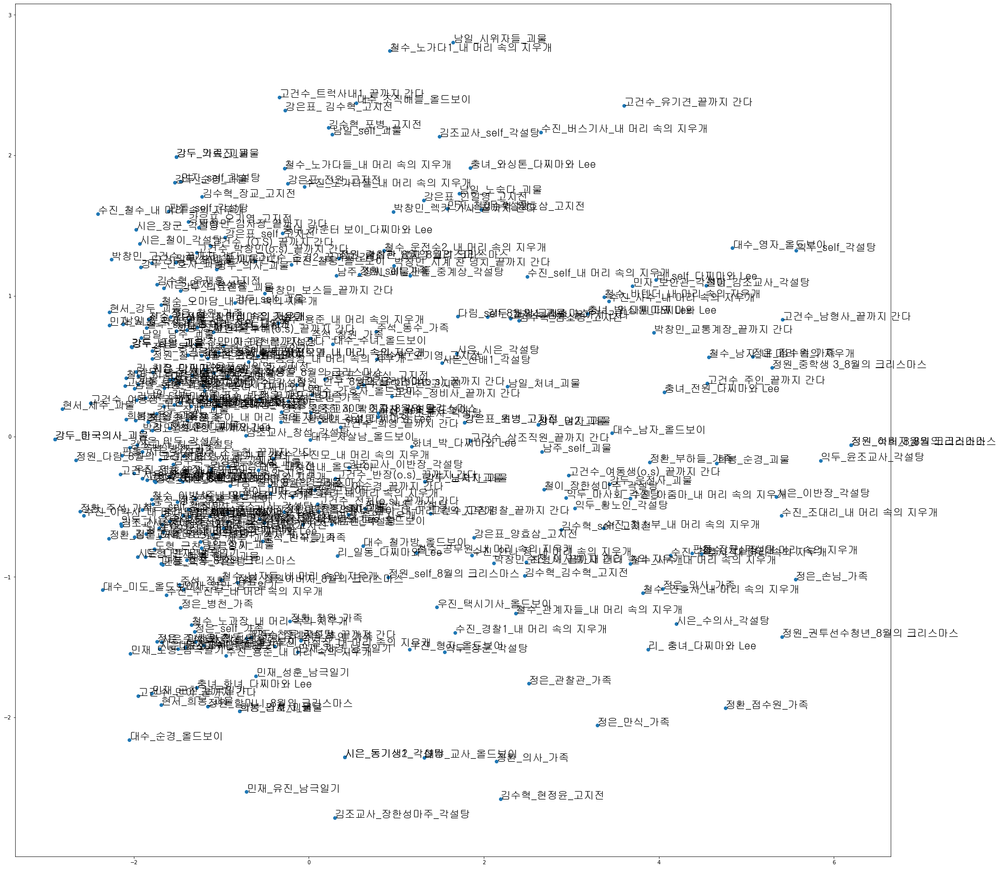

In [49]:
xs = xys[:,0]
ys = xys[:,1]
plt.figure(figsize=(30, 30))
plt.scatter(xs, ys, marker='o')
for i in range(len(ext_data_keys)):
    plt.annotate(ext_data_keys[i],xy=(xs[i],ys[i]), fontproperties=fontprop)

In [154]:
import numpy as np
from numpy import dot
from numpy.linalg import norm

In [155]:
def cos_sim(A, B):
  return dot(A, B)/(norm(A)*norm(B))

In [156]:
total = []
for i in ext_data:
    total.extend(ext_data[i])

In [157]:
total

['번',
 '호',
 '판',
 '이',
 ' ',
 '하',
 '나',
 '도',
 ' ',
 '한',
 ' ',
 '보',
 '이',
 '네',
 '.',
 '왜',
 ' ',
 '웃',
 '어',
 '요',
 '?',
 '이',
 '상',
 '하',
 '다',
 '.',
 ' ',
 '잘',
 ' ',
 '찍',
 '었',
 '는',
 '데',
 ',',
 ' ',
 '아',
 '저',
 '씨',
 '가',
 ' ',
 '잘',
 '못',
 '한',
 ' ',
 '거',
 ' ',
 '아',
 '녜',
 '요',
 '?',
 '할',
 ' ',
 '수',
 ' ',
 '없',
 '죠',
 ' ',
 '뭐',
 '.',
 ' ',
 '아',
 '저',
 '씨',
 ' ',
 '필',
 '름',
 ' ',
 '좀',
 ' ',
 '넣',
 '어',
 ' ',
 '주',
 '세',
 '요',
 '.',
 '좀',
 ' ',
 '해',
 '주',
 '세',
 '요',
 '.',
 '한',
 '참',
 ' ',
 '기',
 '다',
 '렸',
 '어',
 '요',
 '.',
 '이',
 '거',
 ' ',
 '급',
 '한',
 '거',
 '니',
 '까',
 ' ',
 '빨',
 '리',
 ' ',
 '찾',
 '아',
 '오',
 '래',
 '요',
 '.',
 ' ',
 '얼',
 '마',
 '나',
 ' ',
 '걸',
 '려',
 '요',
 ' ',
 '?',
 '아',
 '침',
 '부',
 '터',
 ' ',
 '혼',
 '나',
 '고',
 ',',
 ' ',
 '너',
 '무',
 ' ',
 '더',
 '워',
 '서',
 ' ',
 '그',
 '래',
 '요',
 '.',
 '더',
 '운',
 '건',
 ' ',
 '정',
 '말',
 ' ',
 '싫',
 '어',
 '요',
 '이',
 '번',
 ' ',
 '사',
 '진',
 '은',
 ' ',
 '어',
 '떻',
 '게',
 ' ',
 '나',
 '올',
 '지',
 '.',
 '.'

In [159]:
a = len(total)/len(data2)
a

303.63605442176873

In [204]:
sim_dict = {}
for i in ext_data_keys:
    for x in ext_data_keys[ext_data_keys.index(i):]:
        if len(ext_data[i]) + len(ext_data[i]) > 300:
            sim_dict[i+'/'+x] = (cos_sim(data2[i], data2[x]))

In [206]:
res = sorted(sim_dict.items(), key=(lambda x: x[1]))
for i in res:
    if i[0][i[0].index('/')-1] != i[0][-1]:
        print(i)

('강두_한국의사_괴물/정은_손님_가족', -0.3870086)
('강두_미국의사_괴물/정은_손님_가족', -0.3870086)
('강두_한국의사_괴물/익두_윤조교사_각설탕', -0.33757147)
('강두_미국의사_괴물/익두_윤조교사_각설탕', -0.33757147)
('정원_다림_8월의 크리스마스/익두_윤조교사_각설탕', -0.31616428)
('강두_한국의사_괴물/정은_접수원_가족', -0.31286213)
('강두_미국의사_괴물/정은_접수원_가족', -0.31286213)
('정원_다림_8월의 크리스마스/정은_손님_가족', -0.29636124)
('정원_다림_8월의 크리스마스/수진_조대리_내 머리 속의 지우개', -0.29179713)
('남일_노숙자_괴물/정은_손님_가족', -0.2866225)
('현서_세주_괴물/익두_self_각설탕', -0.27666932)
('현서_강두_괴물/정은_손님_가족', -0.27066767)
('수진_철수_내 머리 속의 지우개/정은_손님_가족', -0.26970926)
('현서_세주_괴물/철수_차실장_내 머리 속의 지우개', -0.26886338)
('현서_세주_괴물/정은_손님_가족', -0.26865038)
('강두_한국의사_괴물/판돌_장군_각설탕', -0.2656428)
('강두_미국의사_괴물/판돌_장군_각설탕', -0.2656428)
('강두_한국의사_괴물/수진_조대리_내 머리 속의 지우개', -0.26384634)
('강두_미국의사_괴물/수진_조대리_내 머리 속의 지우개', -0.26384634)
('현서_세주_괴물/정은_접수원_가족', -0.25934234)
('현서_세주_괴물/익두_윤조교사_각설탕', -0.2583711)
('현서_세주_괴물/정환_접수원_가족', -0.25665516)
('정원_다림_8월의 크리스마스/시은_이반장_각설탕', -0.2513223)
('대수_미도_올드보이/수진_조대리_내 머리 속의 지우개', -0.25054583)
('남일_노숙자_괴물/정환_접수원_가족', -0.2481614

('도형_근찬_남극일기/철수_노가다1_내 머리 속의 지우개', 0.26804185)
('시은_망아지_각설탕/우진_택시기사_올드보이', 0.26817152)
('수진_차실장_내 머리 속의 지우개/정은_만식_가족', 0.2682926)
('민재_self_남극일기/김조교사_장한성마주_각설탕', 0.26833057)
('남일_남주_괴물/우진_택시기사_올드보이', 0.2683358)
('정원_지원_8월의 크리스마스/남일_처녀_괴물', 0.26839027)
('시은_장군_각설탕/우진_self_올드보이', 0.26844782)
('시은_망아지_각설탕/수진_self_내 머리 속의 지우개', 0.2685116)
('강은표_신일영_고지전/리_와싱톤_다찌마와 Lee', 0.26854685)
('정원_정숙_8월의 크리스마스/우진_택시기사_올드보이', 0.26858285)
('시은_마천복_각설탕/대수_조직배들_올드보이', 0.26858732)
('민재_self_남극일기/수진_self_내 머리 속의 지우개', 0.26860622)
('리_화녀_다찌마와 Lee/김조교사_self_각설탕', 0.2686145)
('민재_도형_남극일기/화녀_박_다찌마와 Lee', 0.26863438)
('현서_세주_괴물/화녀_self_다찌마와 Lee', 0.26869673)
('수진_차실장_내 머리 속의 지우개/정은_의사_가족', 0.26881033)
('정원_철구_8월의 크리스마스/정환_self_가족', 0.26881167)
('남일_장씨_괴물/대수_조직배들_올드보이', 0.26894572)
('정원_다림_8월의 크리스마스/리_일동_다찌마와 Lee', 0.26898047)
('시은_마천복_각설탕/철수_사수_내 머리 속의 지우개', 0.26917884)
('남일_장씨_괴물/김수혁_포병_고지전', 0.26921713)
('시은_판돌_각설탕/대수_간호사_올드보이', 0.26926047)
('도형_재경_남극일기/대수_간호사_올드보이', 0.2692693)
('도형_성훈_남극일기/대수_간호사_올드보이', 0.269

('민재_self_남극일기/정은_병천_가족', 0.46871367)
('강은표_신일영_고지전/수진_차실장_내 머리 속의 지우개', 0.46875265)
('남주_남일_괴물/수진_수진부_내 머리 속의 지우개', 0.4687786)
('강두_현서_괴물/도형_민재_남극일기', 0.46888164)
('남일_강두_괴물/정환_창원_가족', 0.4689323)
('시은_self_각설탕/철수_용준_내 머리 속의 지우개', 0.46894354)
('강은표_신일영_고지전/희봉_장씨_괴물', 0.4689875)
('희봉_남일_괴물/철수_노숙자_내 머리 속의 지우개', 0.46904314)
('민재_영민_남극일기/철수_self_내 머리 속의 지우개', 0.46908048)
('민재_근찬_남극일기/철이_민자_각설탕', 0.46912152)
('강은표_최대령_고지전/대수_대수딸_올드보이', 0.46915707)
('도형_영민_남극일기/수진_수진부_내 머리 속의 지우개', 0.46917817)
('민재_self_남극일기/강두_의료진_괴물', 0.46920377)
('민재_self_남극일기/강두_가족_괴물', 0.46920377)
('시은_익두_각설탕/주석_창원_가족', 0.46920416)
('익두_시은_각설탕/수진_김사장_내 머리 속의 지우개', 0.46932286)
('강두_남주_괴물/수진_수진부_내 머리 속의 지우개', 0.46946672)
('수진_이박사_내 머리 속의 지우개/주석_창원_가족', 0.46947023)
('도형_self_남극일기/정은_동수_가족', 0.4695115)
('시은_철이_각설탕/철수_수진모_내 머리 속의 지우개', 0.46951163)
('정원_다림_8월의 크리스마스/민자_self_각설탕', 0.46952477)
('김조교사_마천복_각설탕/수진_공장장_내 머리 속의 지우개', 0.46968496)
('민재_self_남극일기/수진_남자모델_내 머리 속의 지우개', 0.46970186)
('민재_self_남극일기/수진_사진작가_내 머리 속의 지우개', 0.

('정원_정숙_8월의 크리스마스/민재_영민_남극일기', 0.61212605)
('강두_남주_괴물/시은_다은_각설탕', 0.6121315)
('도형_영민_남극일기/대수_미도_올드보이', 0.61213475)
('충녀_리_다찌마와 Lee/대수_수아_올드보이', 0.6121812)
('희봉_남주_괴물/철수_오마담_내 머리 속의 지우개', 0.6121882)
('남주_남일_괴물/정은_교도관_가족', 0.61219734)
('현서_강두_괴물/수진_철수_내 머리 속의 지우개', 0.61226207)
('철이_시은_각설탕/수진_공장장_내 머리 속의 지우개', 0.6122829)
('리_충녀_다찌마와 Lee/철수_이박사_내 머리 속의 지우개', 0.61239123)
('판돌_시은_각설탕/정은_정환_가족', 0.61242443)
('남일_희봉_괴물/정은_정환_가족', 0.6124286)
('민재_근찬_남극일기/김조교사_시은_각설탕', 0.61243093)
('희봉_남일_괴물/익두_판돌_각설탕', 0.6124417)
('민재_도형_남극일기/수진_수진부_내 머리 속의 지우개', 0.61248064)
('정원_지원_8월의 크리스마스/판돌_self_각설탕', 0.61248267)
('강은표_신일영_고지전/김조교사_마천복_각설탕', 0.612608)
('현서_강두_괴물/수진_지현_내 머리 속의 지우개', 0.6126255)
('강은표_유재홍_고지전/수진_윤아_내 머리 속의 지우개', 0.6126303)
('남일_강두_괴물/대수_미도_올드보이', 0.6126454)
('희봉_강두_괴물/민자_시은_각설탕', 0.6126976)
('강두_남일_괴물/철수_박전무_내 머리 속의 지우개', 0.6127054)
('강두_남일_괴물/철수_김사장_내 머리 속의 지우개', 0.6127054)
('김조교사_마천복_각설탕/대수_미도_올드보이', 0.6127059)
('대수_형자_올드보이/정은_병천_가족', 0.61278534)
('현서_세주_괴물/시은_다은_각설탕', 0.6128396)
('시은_판돌_각설

In [211]:
print(ext_data['희봉_남주_괴물'])

애야 ... 니 고모가 ... 고-올드 메달 ... 으어억 ...... 저 사진은 꼭 지 엄마 닮게 나왔어.사고처서 난 애를 사고 처서 보낸거여 ...옛 어른들 말씀 애두, 사람 해친 짐승은 반드시 사지를 절딴내서 끝장을 보는게 ... 그게 사람된 도리라구 그랬는데 ...총포사 장씨 형님 ?그려 ... 내 손으로 직접 쏴죽여야 분이 좀 풀리겠다.대학 나온 니가 좀 자세히 설명을 하지 그랬 ...강두 너 아부지 함 봐봐너 이거 ... 진짜구나 ...아니, 우리가 같이 다니는게 그렇게 눈에 띄냐 ?아무튼 ! 이럴 때 일수록 뭉쳐야 혀, 무조건 같이 다니 ... 여보시요 ? 아 형님 ! ... 아 지금 에레베타라서 ... 더 크게 ! 삐 삼에 ... 삐 삼에 ... 에프십칠 ? 오케오케 !  지금 내가 뭐라 그랬지 ?저 쪽이여 !그게 ... 얘길해두 당최 접수 자체가 안되는겨. 접수가 되두 또 이게 ... 아무튼 우리가 뭔 빽이 있어 뭐가 있어 ...어쨌건, 한강변 하수구를 싸그리 직접 뒤질껴, 빠르고 아쌀하게 ...이 은혜 평생 안 잊을껴 !조용히 해 임마 !아 ... 네냅둬라. 지 몸에 세균소독 한다구 저런다.위에서 있대면 있는가부다 해야지 어쩔것이여그려. 현서 물건 떨어진게 없나, 발자국이 없나 ... 샅샅이들 봐.그래. 이번엔 꼭 찾을꺼 같다.또 그 소리 !조용 !숙여 !잠깐만 냅둬라. 앤 짬짬이 눈을 붙여줘야 돼 ...니들 ... 잠깐만 앉어봐라.니들 보기엔 ... 강두가 그렇게두 한심하냐 ?으유 ... 느그들은 잘 모르겠지만 ... 나는 이런 쫍은데서 하루 종일 애랑 같이 삐대구 지내니까 잘 알지 ...가끔씩 강두 이 놈이 눈빛이 확 - 변할 때가 있거던 ? 뭐시랄까 ... 눈빛이 번쩍 - 하면서 완전히 딴 사람이 되버리는 ...... 거시기 ... 아무튼 말 나온 김에 ! 내 평생 첨이자 마지막으루다가 니네들 붙들구 딱 한마디만 할란다.우리가 말이다 ... 이렇게 오늘날 졸지에 세균 훼 - 미리가 되가지구선 시궁창을 빡빡기면서 하수도를 뒤지구 다닐지 .

In [212]:
print(ext_data['철수_관계자들_내 머리 속의 지우개'])

자 점심들 먹읍시다!


In [172]:
net_list = []

for i in new_data:
    if net_list == []:
        net_list.append({'speaker':i['speaker'],'listener':i['listener'], 'count': 1, 'movie_name': i['movie_name']})
    else:
        true_list=[]
        for x in net_list:
            if (i['speaker'] == x['speaker'] and i['listener'] == x['listener'] and i['movie_name'] == x['movie_name']):
                true_list.append("True")
            else:
                true_list.append("False")
        if "True" in true_list:
            for z in net_list:
                if (i['speaker'] == z['speaker'] and i['listener'] == z['listener'] and i['movie_name'] == z['movie_name']):
                    z['count'] += 1
        else:
            net_list.append({'speaker':i['speaker'],'listener':i['listener'], 'count': 1, 'movie_name': i['movie_name']})

In [173]:
net_list

[{'speaker': '다림', 'listener': 'self', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '다림', 'listener': '정원', 'count': 85, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '다림', 'count': 67, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '철구', 'count': 10, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '중학생들', 'count': 3, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '중학생 3', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '석희', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '정숙', 'count': 10, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '아버지', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '지원', 'count': 17, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원',
  'listener': '뚱뚱한 30대 여자',
  'count': 4,
  'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '경찰관', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원',
  'listener': '술취한 남자',
  'co

In [174]:
for i in net_list:
    if i['listener'] == "self":
        i['listener'] = i['speaker']

In [175]:
node_list = []
for i in net_list:
    if ((i['speaker'],i['movie_name']) and (i['listener'],i['movie_name'])) in node_list:
        continue
    else:
        if (i['speaker'],i['movie_name']) not in node_list:
            node_list.append((i['speaker'],i['movie_name']))
        if (i['listener'],i['movie_name']) not in node_list:
            node_list.append((i['listener'],i['movie_name']))

In [176]:
node_list

[('다림', '8월의 크리스마스'),
 ('정원', '8월의 크리스마스'),
 ('철구', '8월의 크리스마스'),
 ('중학생들', '8월의 크리스마스'),
 ('중학생 3', '8월의 크리스마스'),
 ('석희', '8월의 크리스마스'),
 ('정숙', '8월의 크리스마스'),
 ('아버지', '8월의 크리스마스'),
 ('지원', '8월의 크리스마스'),
 ('뚱뚱한 30대 여자', '8월의 크리스마스'),
 ('경찰관', '8월의 크리스마스'),
 ('술취한 남자', '8월의 크리스마스'),
 ('강은표', '고지전'),
 ('김수혁', '고지전'),
 ('인민군', '고지전'),
 ('현정윤', '고지전'),
 ('초병', '고지전'),
 ('위병', '고지전'),
 ('남성식', '고지전'),
 ('최대령', '고지전'),
 ('신일영', '고지전'),
 ('임소령', '고지전'),
 ('유재홍', '고지전'),
 ('양효삼', '고지전'),
 ('전원', '고지전'),
 ('철이', '8월의 크리스마스'),
 ('효정', '8월의 크리스마스'),
 ('할머니', '8월의 크리스마스'),
 ('민구', '8월의 크리스마스'),
 ('정원아버지', '8월의 크리스마스'),
 ('권투선수청년', '8월의 크리스마스'),
 ('희봉', '괴물'),
 ('강두', '괴물'),
 ('현서', '괴물'),
 ('민재', '남극일기'),
 ('도형', '남극일기'),
 ('근찬', '남극일기'),
 ('영민', '남극일기'),
 ('재경', '남극일기'),
 ('성훈', '남극일기'),
 ('유진', '남극일기'),
 ('여자', '괴물'),
 ('남2', '괴물'),
 ('남주', '괴물'),
 ('남일', '괴물'),
 ('노랑1', '괴물'),
 ('의사', '괴물'),
 ('간호사', '괴물'),
 ('순경', '괴물'),
 ('의료진', '괴물'),
 ('가족', '괴물'),
 ('장씨', '괴물'),
 ('세주', '괴물'),
 ('처녀', '괴물'

In [177]:
node_size = {}
for i in net_list:
    if i['listener'] not in node_size:
        node_size[i['listener']] = i['count']
    if i['listener'] in node_size:
        node_size[i['listener']] += i['count']

In [178]:
node_size

{'다림': 69,
 '정원': 171,
 '철구': 20,
 '중학생들': 6,
 '중학생 3': 2,
 '석희': 2,
 '정숙': 20,
 '아버지': 2,
 '지원': 34,
 '뚱뚱한 30대 여자': 8,
 '경찰관': 2,
 '술취한 남자': 2,
 '김수혁': 107,
 '강은표': 162,
 '인민군': 4,
 '현정윤': 12,
 '초병': 2,
 '위병': 2,
 '남성식': 22,
 '최대령': 12,
 '신일영': 89,
 '임소령': 6,
 '유재홍': 43,
 '양효삼': 7,
 '전원': 58,
 '철이': 31,
 '효정': 20,
 '할머니': 14,
 '민구': 10,
 '정원아버지': 10,
 '권투선수청년': 2,
 '희봉': 92,
 '강두': 133,
 '현서': 36,
 '민재': 145,
 '도형': 57,
 '근찬': 164,
 '영민': 153,
 '재경': 68,
 '성훈': 74,
 '유진': 12,
 '여자': 2,
 '남2': 2,
 '남주': 133,
 '남일': 111,
 '노랑1': 2,
 '의사': 13,
 '간호사': 13,
 '순경': 26,
 '의료진': 6,
 '가족': 6,
 '장씨': 31,
 '세주': 85,
 '처녀': 8,
 '한국의사': 16,
 '미국의사': 16,
 '노숙자': 17,
 '의료진들': 8,
 '순경들': 6,
 '운전사': 2,
 '시위자들': 2,
 '노숙다': 6,
 '남자1': 10,
 '오기영': 17,
 '장교': 10,
 '김종실': 6,
 '인일영': 2,
 '포병': 2,
 ' 김수혁': 2,
 '충녀': 18,
 '화녀': 21,
 '와싱톤': 6,
 '박': 7,
 ' 와싱톤': 5,
 ' 충녀': 2,
 '리': 27,
 '일동': 2,
 '시은': 253,
 '황노인': 11,
 '판돌': 31,
 '장군': 35,
 '익두': 60,
 '망아지': 28,
 '중계상': 4,
 '마사회': 2,
 '유도원': 4,
 '김조교사': 42,
 '

In [179]:
net_list

[{'speaker': '다림', 'listener': '다림', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '다림', 'listener': '정원', 'count': 85, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '다림', 'count': 67, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '철구', 'count': 10, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '중학생들', 'count': 3, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '중학생 3', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '석희', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '정숙', 'count': 10, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '아버지', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '지원', 'count': 17, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원',
  'listener': '뚱뚱한 30대 여자',
  'count': 4,
  'movie_name': '8월의 크리스마스'},
 {'speaker': '정원', 'listener': '경찰관', 'count': 1, 'movie_name': '8월의 크리스마스'},
 {'speaker': '정원',
  'listener': '술취한 남자',
  'coun

In [180]:
print(len(node_size),len(node_list))

204 215


In [181]:
from pyvis.network import Network
import math
import networkx as nx

In [211]:
import random
get_colors = lambda n: list(map(lambda i: "#" + "%06x" % random.randint(0, 0xFFFFFF),range(n)))
net_colors = get_colors(10)

In [212]:
net_colors

['#57b16c',
 '#e48b92',
 '#11e643',
 '#d40004',
 '#9b3744',
 '#6e3a08',
 '#4fc0f7',
 '#bc0281',
 '#712281',
 '#15df9a']

In [213]:
movie_list =[]
for i in node_list:
    if i[1] not in movie_list:
        movie_list.append(i[1])

In [214]:
movie_list

['8월의 크리스마스',
 '고지전',
 '괴물',
 '남극일기',
 '다찌마와 Lee',
 '각설탕',
 '끝까지 간다',
 '올드보이',
 '내 머리 속의 지우개',
 '가족']

In [216]:
import matplotlib.font_manager as fm
path = 'C:/Windows/Fonts/NGULIM.ttf'
fontprop = fm.FontProperties(fname=path, size = 30)

In [215]:
net = Network(width='100%', height='100%', font_color="black",heading="Movie Character Network",directed=True)

for i in node_list:
    net.add_node(n_id=i[0]+i[1], label=i[0], labelHighlightBold=True, color=net_colors[movie_list.index(i[1])], value = math.sqrt(node_size[i[0]]))
    
for i in net_list:
    net.add_edge(i['speaker']+i['movie_name'], i['listener']+i['movie_name'], weight=i['count'], width = math.sqrt(i['count']))
    
net.repulsion(central_gravity=0.1)
net.show_buttons(filter_=["physics"])
net.set_edge_smooth('dynamic')
net.show("Movie Character Network.html")

In [225]:
Adjectives=   {'정원_다림_8월의 크리스마스': '누를 좋 나쁜가 낫 나빠 힘들 어렸 좋 급한 괜찮 어린 좋 좋 좋 큰 많 재미있 귀여워서 힘들 힘들 예쁘 더울 더운 싫 어떨 무섭 어떨 무섭 그렇 무서운데 어떨 무서워져', '정원_철구_8월의 크리스마스': '젊 같', '다림_정원_8월의 크리스마스': '급한 더워서 더운 싫 힘들 같 노란 더운 지겨워 어린 나빠 무거운 어지럽 급한 싫 좋 많 편하 지겨워 편해요 더워서 싱겁 그렇 그렇 우습 싫 같 싫 싫 재미없 싫 그렇 빠르 무서워서 무섭 무서워', '정원_중학생들_8월의 크리스마스': '흐리', '정원_지원_8월의 크리스마스': '그렇 싫 아픈 지겨운 겉', '강은표_최대령_고지전': '많 많 어떻', '김수혁_임소령_고지전': '그렇', '강은표_김수혁_고지전': '괜찮 길 늦 컸 좋 약 잘난 똑같 그렇', '강은표_유재홍_고지전': '정신없 컸', '강은표_신일영_고지전': '좋 힘들 같 세 많 가깝', '김수혁_유재홍_고지전': '늦 그렇 그렇 높 높 뛰어난', '정원_self_8월의 크리스마스': '긴', '다림_효정_8월의 크리스마스': '괜찮 많 좋', '정원_정숙_8월의 크리스마스': '늦', '다림_철이_8월의 크리스마스': '좋', '민재_유진_남극일기': '아름다워요', '도형_근찬_남극일기': '좋 큰 길 그렇 빠른 어떻 아름답 많 무서운 그래 편하 같 길 같 강해 새하얀 반갑 세 약해빠진', '도형_영민_남극일기': '멀 큰 길 그렇 빠른 어떻 아름답 많 무서운 그래 편하 같 길 괜찮 같 강해 새하얀 반갑 무서운', '도형_민재_남극일기': '큰 길 그렇 엄청난 춥 무서웠 같 같 큰 같 높 빠른 어떻 아름답 많 무서운 그래 편하 같 길 같 강해 새하얀 반갑 좋 약해빠진 작 춥 무섭', '도형_재경_남극일기': '큰 길 괜찮 어때 늦 어려워 그렇', '도형_성훈_남극일기': '큰 길 그렇 많 빠른', '민재_self_남극일기': '그래선지 같 그런지 새파란 같 같 아름다운', '민재_재경_남극일기': '같', '민재_근찬_남극일기': '멋지 춥 같 같 그런가 좋 편해 같 센 그런가 같 그렇 이러다간 옳 어떻 같', '민재_도형_남극일기': '괜찮 같 그렇 싫 싫 같', '민재_영민_남극일기': '그렇', '현서_강두_괴물': '크 같 큰 같 큰', '현서_희봉_괴물': '예뻐', '희봉_남일_괴물': '많 그려 그렇 이럴 크 빠르 아쌀하 냅 그려 같 냅 시커멓', '남주_희봉_괴물': '이쁜데 그렇 싫 괜찮', '남주_남일_괴물': '이쁜데 그렇 싫 괜찮', '남일_희봉_괴물': '친하 많 씨 이럴 저런데', '남일_남주_괴물': '친하 많 씨 이럴 저런데', '희봉_남주_괴물': '그려 그렇 이럴 크 빠르 아쌀하 냅 그려 같 냅 시커멓', '강두_희봉_괴물': '같 굵 쎄 근지럽 큰 크 커', '강두_의사_괴물': '같', '강두_간호사_괴물': '같', '강두_순경_괴물': '그래', '강두_의료진_괴물': '그래', '강두_가족_괴물': '그래', '남일_순경_괴물': '같 그래', '희봉_강두_괴물': '그렇 이럴 크 빠르 아쌀하 냅 그려 같 그려', '남일_강두_괴물': '씨 이럴 저런데', '희봉_장씨_괴물': '빠르 아쌀하', '강두_남일_괴물': '굵 쎄 근지럽 큰 크 커', '강두_남주_괴물': '굵 쎄 근지럽 큰 크 커', '강두_장씨_괴물': '굵 쎄', '남주_강두_괴물': '그렇 싫 괜찮 엄청나 큰', '현서_세주_괴물': '엄청나 잘생기 괜찮 소용없 좋 어때 어때 무서우', '남일_장씨_괴물': '많 쎈', '강두_한국의사_괴물': '커', '강두_미국의사_괴물': '커', '남일_노숙자_괴물': '좋', '강두_순경들_괴물': '싫 좋', '강두_의료진들_괴물': '좋', '강두_세주_괴물': '나쁜 여깄', '남일_시위자들_괴물': '시끄러', '김수혁_강은표_고지전': '쉽 같 똑같 많 같 어때 어때 많 더럽 지겨운 같 같 잘난 먼 먼 빨라도 좋', '김수혁_전원_고지전': '같', '김수혁_오기영_고지전': '그래', '강은표_김종실_고지전': '뼈저리', '강은표_남성식_고지전': '그래', '강은표_오기영_고지전': '같', '강은표_ 김수혁_고지전': '같', '김수혁_신일영_고지전': '어두우', '충녀_화녀_다찌마와 Lee': '좋 촌스럽', '화녀_충녀_다찌마와 Lee': '같', '화녀_박_다찌마와 Lee': '같', '리_박_다찌마와 Lee': '더러운 같', '리_ 와싱톤_다찌마와 Lee': '더러운 같', '화녀_self_다찌마와 Lee': '같', '리_화녀_다찌마와 Lee': '괜찮 즐거운 깊 같', '리_ 충녀_다찌마와 Lee': '괜찮', '충녀_리_다찌마와 Lee': '두려워 착하 두려워', '리_일동_다찌마와 Lee': '바른', '리_충녀_다찌마와 Lee': '젊 같 좋 같 같 즐거운 깊 같', '판돌_황노인_각설탕': '괜찮', '판돌_self_각설탕': '좋', '시은_장군_각설탕': '싫 간지러워 단', '판돌_시은_각설탕': '싫 싫 무섭 친했 무섭 으떻 무섭 시 늦 솔찮 시 으떻 좋 같 시 그렇 시 힘들', '시은_판돌_각설탕': '싫 무섭 배고프 고마워', '익두_판돌_각설탕': '시', '판돌_익두_각설탕': '시 큰 이럴', '시은_황노인_각설탕': '늦 늦', '시은_익두_각설탕': '모자라서 컸 건 이쁘', '시은_망아지_각설탕': '같 배고프 멋있 어때', '김조교사_시은_각설탕': '싫 같 좋 무서워', '김조교사_철이_각설탕': '싫 많', '시은_다은_각설탕': '예쁘 무서워서', '시은_self_각설탕': '이럴 같 즐겁 빨리요 그리워 같', '시은_윤조교사_각설탕': '어려서 좋 시 어떻 상관없', '민자_시은_각설탕': '구린 같 많 시 밉 밉 싫 시 그래 그래', '시은_김조교사_각설탕': '같 같', '시은_마천복_각설탕': '좋 고마워 어때 좋 좋 이래요', '익두_시은_각설탕': '늦 좋 노란 좋 쉽 쉽 크 같 두려웠', '시은_민자_각설탕': '같', '시은_천둥_각설탕': '아팠 괜찮 괜찮 예쁘 좋 괜찮 어떻 어떻 이럴 아팠 좋 좋 괜찮 괜찮', '익두_천둥_각설탕': '고맙 고맙 고맙', '김조교사_윤조교사_각설탕': '이래', '시은_동기생1_각설탕': '고마워 어때', '시은_동기생2_각설탕': '고마워 어때', '민자_마천복_각설탕': '크 늦', '민자_self_각설탕': '아파', '시은_철이_각설탕': '반가워서 나쁜 좋 좋', '김조교사_마천복_각설탕': '어때 컸', '리_회장_다찌마와 Lee': '어떨까 어린 약한 못난 구린 구리 하얀 같 하얀 순한', '대수_순경_올드보이': '이쁜 늦 그래 큰 이쁜 그래 좋 그래 늦 착하', '대수_주환_올드보이': '착하 많 불러 같 빨간', '대수_대수딸_올드보이': '이쁜', '대수_대수아내_올드보이': '많', '대수_self_올드보이': '쉬워졌 친해 짧 많 그렇 상관없 즐거워졌 높', '미도_대수_올드보이': '그런 많 차 뜨거워 좋 좋 그렇 외로운 외로운 외로운 편하 좋 나쁜 어떻 아프 좋 좋 좋 재밌 좋 힘들 같 큰 좋 차 싫 어떻 아프 좋 좋 좋 이래 춥', '대수_미도_올드보이': '더워서 어지러웠 같 같 젊 착하', '우진_대수_올드보이': '같 괜찮 짧 상관없 힘세 괜찮 약하 쉽 같 같 그렇 외롭 좋 어떨까 같 많 싱거운 하찮 귀찮 재미없 재밌 재미있 그렇 뛰어난 쉬운 어떻 미워할 그럴', '대수_우진_올드보이': '고맙 무서웠 미웠', '우진_철웅_올드보이': '많', '대수_수아_올드보이': '좋 그래', '대수_형자_올드보이': '고맙', '수진_수진모_내 머리 속의 지우개': '같 같 힘들 그럴', '수진_정은_내 머리 속의 지우개': '같 같 힘들 그럴', '수진_수진부_내 머리 속의 지우개': '밉', '철수_박전무_내 머리 속의 지우개': '그렇 엄한 약해서', '철수_김사장_내 머리 속의 지우개': '그렇 엄한 약해서', '수진_김사장_내 머리 속의 지우개': '그래', '철수_수진_내 머리 속의 지우개': '괜찮 괜찮 편하 반갑 이쁘 멋있 많 편하 싫 좋 같 같 많 이래 싫 무서워 무서운지 아프 같 이래 재수없 같 높 높 어려워서 그렇 이래 즐거워 좋 좋 괜찮 싫 재밌 같 이래 좋 힘들 힘들 싫 귀찮 그래 고마워 좋 어때 좋 좋 어지러운 멋있 크', '수진_철수_내 머리 속의 지우개': '괜찮 고맙 심해요 무거워 묘한 어렸 같 어떻 어릴 어땠 어릴 많 싫 힘들 무서 같 좋 좋 싫 심해졌 그래 같 좋 부러워 같 새로운 좋 힘들 힘든 쉬워 뻔한 쉽 어때 무서운 무서워 같 맛있 괜찮 귀찮 크 무서워요 짧 급해요 높 좋 무서워요', '수진_윤아_내 머리 속의 지우개': '잘 재밌 재밌 쎄 그런', '수진_노가다들_내 머리 속의 지우개': '괜찮 더러운 좋', '수진_공장장_내 머리 속의 지우개': '부드럽', '수진_지현_내 머리 속의 지우개': '재밌 재밌 쎄 그런', '수진_명주_내 머리 속의 지우개': '재밌 재밌 쎄 그런', '수진_차실장_내 머리 속의 지우개': '급한', '철수_남자들_내 머리 속의 지우개': '괜찮', '수진_남자모델_내 머리 속의 지우개': '흔한', '수진_사진작가_내 머리 속의 지우개': '흔한', '수진_조대리_내 머리 속의 지우개': '괜찮', '수진_이박사_내 머리 속의 지우개': '같 크 아파 약해요 이래요 큰 쉬운 어떻 빨리요', '철수_오마담_내 머리 속의 지우개': '드럽 많', '수진_용준_내 머리 속의 지우개': '그럴', '철수_용준_내 머리 속의 지우개': '좋', '수진_유리_내 머리 속의 지우개': '예쁜 좋', '정은_교도관_가족': '고마웠', '정은_주인_가족': '고맙', '정환_self_가족': '이래', '정은_정환_가족': '컸 어려워 싸 아파 괜찮 좋', '정환_정은_가족': '예뻐졌 재미없 재미없 그렇 그렇 좋 쉽 그래 싫 많 좋 밝 똑같 멋있 재밌 간지러워 좋 아프 길 아프 이래 짜 같 싫 어때 아파 싫 아퍼', '정환_주석_가족': '쉽 그래 싫 이래 좋 같 싫 어때', '주석_정은_가족': '같 상관없 무서워 싸 추워 높 힘들 힘들 같 재밌 힘들 좋 무거웠 괜찮 좋 싱겁 아픈 같 힘들 컸 컸 끈질기 좋 쉬운데 멋진 같 좋 아프 좋 착하 좋', '정은_주석_가족': '고마워요 고맙 싸 싫 더러운 편한 좋 같 그럴 어떻 어떻 이렇 좋 같 편해요 같 어떠세요 쉬웠 다르 정답', '정은_창원_가족': '컸 같 많', '정은_동수_가족': '같 많', '주석_손님_가족': '추워', '정은_의사_가족': '괜찮 괜찮', '주석_만식_가족': '심하', '주석_병천_가족': '심하', '주석_친구들_가족': '심하', '정은_병천_가족': '고마운 이러실 다를 어려워요 그렇 많 고맙', '주석_정환_가족': '같 좋 같 힘들 컸 컸', '정환_병천_가족': '아프 괜찮', '정은_만식_가족': '고맙'}
Adverbs=  {'다림_self_8월의 크리스마스': '한', '다림_정원_8월의 크리스마스': '왜 잘 잘못 좀 좀 한참 빨리 얼마나 너무 정말 어떻게 안 왜 그런 이 다 이 이런 굉장히 이제 그런 그냥 그런 못 좀 이제 잘 근데 몇 그렇게 완전히 아직 안 그런데 왜 이렇게 또 아무 안 아직 한번 제대로 못 다 어느 오늘 꼭 안 안 안 늘 겨우 그렇게 많이 잘 이렇게 똑같이 좀 후다닥 내 저 같이 다 너무 정말 이런 왜 그냥 다 뜻대로 별 그냥 그렇게 아둥바둥 빨리 이런 참 꼭 맨 이따가 어제 안 그냥 안 왜 잘 혹시 처음 안 근데 그냥 언제 한 벌써 역시 이 어떻게 직접 갑자기 안', '정원_다림_8월의 크리스마스': '이리 잘 이따가 안 아까 저 왜 그래도 지금 잘 안 저런 더 이리 어떤 왜 벌서 별 다 이 이 그냥 내일 그럼 많이 어떻게 왜 그런 정말 다 잘 그냥 근데 조금 조금 더 턱 좀 살짝 더 웬 잘 좀 그러면 좀 왜 안 잘 혼자 이렇게 오랫 굉장히 근데 내 바로 이렇게 한참 그래서 같이 안 그냥 절대 안 분명 안 몇 그 또 안 그렇게 안 그런데 막', '정원_철구_8월의 크리스마스': '너무 이렇게 정말 매일 그 그 그만큼 그만 안 또 그만', '정원_중학생들_8월의 크리스마스': '이 좀 이 내일', '정원_지원_8월의 크리스마스': '잘 왜 깜짝 언제 아직 벌써 욱 그냥 아무', '정원_정숙_8월의 크리스마스': '그런 이제 그만 오래 전 벌써 욱 갑자기', '정원_뚱뚱한 30대 여자_8월의 크리스마스': '많이 새', '정원_경찰관_8월의 크리스마스': '조용히 왜 조용히', '정원_술취한 남자_8월의 크리스마스': '조용히 왜 조용히', '강은표_김수혁_고지전': '빨리 무슨 잘 니 곧 금방 이 그나저나 아직 아직 어떻게 많이 저렇게 그래서 그래서 그래서 그래서 다 모든 똑같이 다 같이 왜 그리고 어떻게 이제 제발 좀 그만', '김수혁_현정윤_고지전': '제발', '강은표_남성식_고지전': '이 안 왜 왜 왜 왜', '강은표_최대령_고지전': '그냥 얼마나 전혀 매일 매일 전 잘 잘 다 잘 근데 왜 그럼', '김수혁_강은표_고지전': '다시 금방 이렇게 다시 이렇게 그냥 지금 다 갑자기 이 다 첫 좀 꼭 바로 총 이 똑바로 그런 그냥 서로 적당히 저 한 그 꼭 도대체 이렇게 이 몇 한 꼭 다 그래서 어차피 다시 다 그래서 다 당연히 항상 다시 어느 그 여러 또 그런 그래서 다 그 항상 그럼 뭔 또 안 한 더 한 더 그 어떤 진짜 다 그 어떻게 다 다 이 그 그 곧 그래서 왜 이 안 빨리 어서 딴 어서 왜 진짜 그 더 다 잘 아무리 이렇게 어서 빨리 가끔 그런 아주 오래 모두 그리고 이 저 오래 아니면 그렇게 많이 당연히 더 그냥 계속 서로 오늘 오늘', '강은표_신일영_고지전': '몇 몇 안 이 이 몇 그럼 아까 오늘 내일 왜 꼭 천천히 좀 천천히 마저 이미 다 이 안 아주', '강은표_유재홍_고지전': '바로 그냥 아마 그 안 가장 즉시 모두 답니까 다시 못', '김수혁_유재홍_고지전': '안 또 열심히 너무 저 그 즉시 완전히 그 모두 못 즉시', '강은표_양효삼_고지전': '좀 그럼 한', '김수혁_self_고지전': '또 한 한 더', '김수혁_김수혁_고지전': '못', '다림_철이_8월의 크리스마스': '못', '다림_효정_8월의 크리스마스': '못 이런 얼마나 별로 꼭', '정원_할머니_8월의 크리스마스': '다시 이리 다시 좀 잠깐', '정원_self_8월의 크리스마스': '안', '정원_민구_8월의 크리스마스': '잘 좀 많이', '정원_정원아버지_8월의 크리스마스': '안 왜 아직 안 이제 한', '정원_권투선수청년_8월의 크리스마스': '다시 한번 더', '희봉_self_괴물': '가만 아까 일루 더', '강두_self_괴물': '벌써 안 도대체', '희봉_강두_괴물': '좀 한 빨리 도저히 못 조마조마 이리 좀 방금 이런 빨리 도대체 현 니 안 그런 좀 자세히 아부지 같이 아무튼 무조건 같이 지금 더 삐 삐 지금 저 당최 안 또 아무튼 뭔 어쨌건 한 싸그리 직접 이 안 조용히 지 샅샅이 꼭 또 그 조용 왜 니 한', '도형_근찬_남극일기': '전부 힘껏 가장 도대체 왜 그렇게 그런 무슨 그 무슨 곰곰히 그럼 그 그래서 가장 바로 지금 두 하지만 이 내내 가장 쨍쨍 한 처음 꼭 전부 이렇게 가끔 한 그렇게 다 막 내일 최대한 그 다른 그리고 오늘 각자 충분히 휴식 안 어떤 다 이제 이 그렇게 영원히 혼자 다른 현재 정확히 내일 전부 가만히 빨리 제일 다시 다 당연히 그럼 하지만 그 분명히 하지만 올 없이 마냥 가장 그 틀림없이 그래서 다시 없이 그렇게 호락호락 바로 이 저 저 얼마나 얼마나 하지만 이런 빨리 벌써 그냥 이 안 안 두 빨리 못 지금 다시 그 지금 그런 거의 다 빨리 근데 이 너무 이 이 이 전부 다 안 이 아주 조금 점점 더 가장 더 분명히 어떤 안 더 못 안 다 지금 한 이 그냥 이대로 다 왜 못 안 잘', '도형_영민_남극일기': '전부 힘껏 오늘 어떻게 이제 아직 정확히 가장 도대체 왜 그렇게 그런 무슨 그 무슨 곰곰히 그럼 그 그래서 가장 바로 지금 두 하지만 이 내내 가장 쨍쨍 한 처음 꼭 전부 이렇게 가끔 한 그렇게 다 그 아마 이 내일 최대한 그 다른 그리고 오늘 각자 충분히 휴식 안 어떤 다 이제 이 그렇게 영원히 혼자 다른 현재 정확히 내일 전부 가만히 그대로 가만히 그대로 괜히 그럼 더 빨리 다 당연히 그럼 하지만 그 분명히 하지만 올 없이 마냥 가장 그 틀림없이 그렇게 호락호락 바로 이 저 저 얼마나 얼마나 하지만 이런 빨리 벌써 그냥 이 안 안 겨우 두 빨리 못 지금 다시 그 안 정말 지금 그런 거의 다 빨리 안 어떤 벌써 왜 다시 다 전부 근데 이 너무 이 이 이 전부 다 안 이 아주 조금 점점 더 가장 더 분명히 어떤 이제 다 지금 한', '도형_재경_남극일기': '전부 힘껏 가장 도대체 왜 그렇게 그런 무슨 그 무슨 곰곰히 그럼 그 그래서 가장 바로 지금 두 하지만 이 내내 가장 쨍쨍 한 처음 꼭 전부 이렇게 가끔 한 그렇게 다 내일 최대한 그 다른 그리고 오늘 각자 충분히 휴식 그래도 지금 딱딱 없이 안 많이 이렇게 언젠가 네 그 한 천천히 안 어떤 다', '도형_성훈_남극일기': '전부 힘껏 가장 도대체 왜 그렇게 그런 무슨 그 무슨 곰곰히 그럼 그 그래서 가장 바로 지금 두 하지만 이 내내 가장 쨍쨍 한 처음 꼭 전부 이렇게 가끔 한 그렇게 다 내일 최대한 그 다른 그리고 오늘 각자 충분히 휴식 안 그래서 더 안 아무 안 지금 그래서 이 그렇게 아까 왜 훨씬 이런 어떤 다 이제 이 그렇게 영원히 혼자 다른 현재 정확히 내일 전부 가만히', '민재_유진_남극일기': '오늘 다시 전부 너무 많이', '민재_도형_남극일기': '정말 오늘 다시 그러니까 전부 저 조금 하지만 안 오래 저 안 어떤 지금 무슨 그 무슨 다 무슨 제발 그냥 도대체 도대체 그냥 그냥 한 한', '민재_근찬_남극일기': '오늘 다시 어차피 좀 거의 그냥 이 똑같이 근데 이 왜 꼭 일찍 그래서 왜 그런 잘 하여튼 좀 가끔 근데 혼자 어느 너무 아마 그 근데 그런 근데 어떻게 안 진짜 무슨 자세히 좀 근데 좀 분명히 한 근데 이 전부 어떻게 근데 꼭 어제 근데 아무리 안 어떤 지금 무슨 정말 빨리 그 어떻게 정말 가까이 어떻게 진짜 안 다 아직 진짜 무슨', '민재_영민_남극일기': '오늘 다시 안 어떤 지금 왜 그래도 무슨 분명히 다른 분명히 자꾸 그렇게 지금 어떻게 안 안 그딴 제발 빨리 다', '민재_재경_남극일기': '오늘 다시 그', '민재_성훈_남극일기': '오늘 다시', '도형_민재_남극일기': '가장 도대체 왜 그렇게 그런 무슨 그 무슨 곰곰히 그럼 그 그래서 가장 바로 지금 두 하지만 이 내내 가장 쨍쨍 한 처음 오늘 단단히 꼭 전부 이렇게 가끔 한 그렇게 다 막 내일 최대한 그 다른 그리고 오늘 각자 충분히 휴식 잘 훨씬 한 어느 조용히 영원히 똑같이 하지만 다른 그렇게 그런 어떤 다른 적어도 같이 많이 다 얼마나 그럼 몇 그렇게 안 어떤 다 이제 이 그렇게 영원히 혼자 다른 현재 정확히 내일 전부 가만히 빨리 제일 다시 다 당연히 그럼 하지만 그 분명히 하지만 올 없이 마냥 가장 그 틀림없이 그렇게 호락호락 바로 이 저 저 얼마나 얼마나 하지만 이런 빨리 벌써 그냥 이 안 안 두 빨리 못 지금 왜 다시 그 지금 그런 거의 다 빨리 근데 이 너무 이 이 이 전부 다 안 이 아주 조금 점점 더 가장 더 분명히 어떤 다 지금 한 근데 같이 다 그래도 안 언제 함부로 왜 하나같이 그냥 그 한 왜 못 한 한번 그런데 혼자 이렇게', '민재_self_남극일기': '지금 저 쨍쨍 그리고 계속 매일 하지만 왠지 자꾸 한 저 그런 안 전부 안 안 지금', '도형_self_남극일기': '또 지금 아무런 가만 마져 헉헉헉', '강두_현서_괴물': '어째 꼭 좀 으아', '현서_강두_괴물': '왜 아직 안 대개 아주 으아', '현서_희봉_괴물': '안 저 젤', '희봉_현서_괴물': '도저히 못 조마조마 이리 좀 진짜 현', '강두_희봉_괴물': '으아 다 자꾸 지금 이 못 지금 삐 그러니까 이 계속 여지껏 젤 내 한 빨리 일단 일루', '강두_남주_괴물': '다 지금 이 못 지금 삐 그러니까 이 계속 여지껏 젤 내 한 빨리 일단 일루 빨리 안 빨리 잘', '희봉_남주_괴물': '니 저 꼭 옛 반드시 딴 총 직접 좀 좀 자세히 아부지 같이 아무튼 무조건 같이 지금 더 삐 삐 지금 저 당최 안 또 아무튼 뭔 어쨌건 한 싸그리 직접 이 안 조용히 지 샅샅이 꼭 또 그 조용 잠깐 짬짬이 잠깐 그렇게 두 잘 이런 같이 삐 잘 가끔 이 확 번쩍 완전히 딴 아무튼 딱 한 이렇게 빡빡 불과 못 실로 참 안 하기야 다 또 다 또 더더욱 하여튼 이런 그저 한 그리구 게다가 일루 다 다 잘 절대 안 왜 다른 이 이딴 절대루 그런 바로 이 두 니 한', '남일_강두_괴물': '근데 다 다른 이 근데 안 근데 진짜 삐 좀 저런 왜 안 안 뭔 왜 도대체 왜 그만 좀 근데 좀 뭔 좀 한 두 잠깐 좀 똑바루 딱 한 진짜루 안 그냥 이런 이런', '남일_희봉_괴물': '이 무슨 어쩌다 그럼 아부지 그 그 근데 안 근데 진짜 삐 좀 저런 왜 안 안 뭔 왜 도대체 왜 그만 좀 근데 좀 뭔 좀 한 두 잠깐 좀 똑바루 딱 한 진짜루 안 그냥 진짜 이 그럼 그냥 어차피 안', '희봉_남일_괴물': '고만 니 원래 저 꼭 옛 반드시 딴 총 직접 좀 좀 자세히 아부지 같이 아무튼 무조건 같이 지금 더 삐 삐 지금 저 당최 안 또 아무튼 뭔 어쨌건 한 싸그리 직접 이 안 조용히 지 샅샅이 꼭 또 그 조용 잠깐 짬짬이 잠깐 그렇게 두 잘 이런 같이 삐 잘 가끔 이 확 번쩍 완전히 딴 아무튼 딱 한 이렇게 빡빡 불과 못 실로 참 안 하기야 다 또 다 또 더더욱 하여튼 이런 그저 한 그리구 게다가 일루 다 다 잘 절대 안 왜 다른 이 이딴 절대루 그런 바로 이 두 니 한', '남주_희봉_괴물': '왜 훨 행여 뚝 벌써 잠깐 어쨌든 지금 이 삐 그만 좀 별 빨리 처음', '남주_남일_괴물': '왜 훨 행여 뚝 벌써 잠깐 어쨌든 지금 이 삐 그만 좀 별 빨리 처음', '남일_남주_괴물': '무슨 어쩌다 그럼 아부지 그 그 근데 안 근데 진짜 삐 좀 저런 왜 안 안 뭔 왜 도대체 왜 그만 좀 근데 좀 뭔 좀 한 두 잠깐 좀 똑바루 딱 한 진짜루 안 그냥 진짜 이 그럼 그냥 어차피 안 이런 이런', '강두_노랑1_괴물': '쪼끔', '강두_의사_괴물': '자꾸', '강두_간호사_괴물': '자꾸 안 안 그만 이 이 빨리 빨리', '희봉_의사_괴물': '안 그런', '희봉_간호사_괴물': '안 그런', '현서_self_괴물': '제발 제발 잘', '강두_순경_괴물': '그러니까 안 좀 그러니까 잘 이 이렇게 완전히 찌 이렇게', '강두_의료진_괴물': '잘 이 이렇게 완전히 찌 이렇게', '강두_가족_괴물': '잘 이 이렇게 완전히 찌 이렇게', '남일_순경_괴물': '다 좀 내 한 못', '강두_남일_괴물': '지금 이 못 지금 삐 그러니까 이 계속 여지껏 젤 내 한 빨리 일단 일루 빨리 안 빨리', '남주_강두_괴물': '잠깐 어쨌든 지금 이 삐 그만 좀 별 처음 지금 바로', '강두_장씨_괴물': '그러니까 이', '희봉_장씨_괴물': '당최 안 또 아무튼 뭔 어쨌건 한 싸그리 직접 이 안', '남일_장씨_괴물': '저런 왜 안 안 사실 원래 어쩌구 같이 잘 총 젤 딱 더 안 그럼 이 좀 그 딱 그 좀', '남주_장씨_괴물': '그만 좀 별', '현서_세주_괴물': '혹시 떡 진짜 잠깐 또 한 반드시 잘 뚝 한 잘 이 왼 잘 몇 딱 이렇게 벌써 몇 이렇게 질질 다 이제 아까 안 아깐 저 그냥 그럼 먼저 저 이 그럼 바루 요 더', '강두_한국의사_괴물': '지금 안 지금', '강두_미국의사_괴물': '지금 안 지금', '남일_노숙자_괴물': '원래 텅 바글바글 얼마나 완전 잘', '강두_순경들_괴물': '넘 한 즉시', '강두_의료진들_괴물': '한 즉시', '강두_세주_괴물': '혼자 어떻게 어떻게 같이 왜 왜 같이 이 이 이렇게 이', '남일_시위자들_괴물': '다', '남일_self_괴물': '빨리 안', '남일_노숙다_괴물': '지금 빨리', '김수혁_오기영_고지전': '한 다 왜', '김수혁_전원_고지전': '다 안 안 빨리 안 어떤 진짜 못 그대로 어떻게 잠깐 근데 왜 즉시', '강은표_전원_고지전': '안 바로', '김수혁_장교_고지전': '왜 안 몇', '김수혁_인민군_고지전': '이 빨리', '김수혁_남성식_고지전': '왜 한', '강은표_김종실_고지전': '대부분', '김수혁_신일영_고지전': '안 가만 가만 왜 안 안', '강은표_오기영_고지전': '이 다 이 그냥', '김수혁_포병_고지전': '즉시', '강은표_ 김수혁_고지전': '다 이', '강은표_self_고지전': '다 다', '강은표_현정윤_고지전': '맘대로 이 왜 근데', '충녀_화녀_다찌마와 Lee': '너무 이제 저 그 열심히 그리고 언제나 아까', '화녀_충녀_다찌마와 Lee': '특히 어쩜 저런 이렇게', '충녀_와싱톤_다찌마와 Lee': '왜', '화녀_박_다찌마와 Lee': '다른 그냥', '충녀_박_다찌마와 Lee': '정말 왜', '충녀_ 와싱톤_다찌마와 Lee': '정말 왜', '리_박_다찌마와 Lee': '어서 그 안', '리_ 와싱톤_다찌마와 Lee': '어서 그 안', '화녀_self_다찌마와 Lee': '한', '리_일동_다찌마와 Lee': '이제 더', '리_충녀_다찌마와 Lee': '많이 특히 어떻게 오늘 모두 이제 그만 모처럼 모처럼 천만 다행이', '충녀_리_다찌마와 Lee': '좀 그래서 아무 사실 잠시 이런 이제 마음껏 잠깐', '시은_self_각설탕': '가장 그런 그러니까 잘 잘 깜짝 너무 똑같이 세 좀 점차 항상 참 열심히 다시 점차 지금 가장 이제야', '판돌_self_각설탕': '안 저런 뭔', '시은_장군_각설탕': '또 왜 그러니까 또 그래도 안 많이 조금 안', '판돌_시은_각설탕': '한 이리 맨날 잠 안 내 다 느그 다 그래도 안 무신 니 몬 니 그 아직 몬 그나저나 니 아부지 벌써 어쩌구 니 이 요즘 몬 꼭 니 다 니 을매나 뭔 안 니 많이 오죽 니 많이', '시은_판돌_각설탕': '두근 두근 또 좀 그래야 쑥 쑥 잘 빨리', '익두_판돌_각설탕': '지금 안 몇 절대 안', '익두_황노인_각설탕': '그럼', '판돌_황노인_각설탕': '그라믄 어떻게 좀', '익두_장군_각설탕': '더 잘 계속 계속', '시은_익두_각설탕': '그만 제발 그만 없이 이만큼 지 그러니까 다 못 왜 왜 그냥 어떤 이 참 꼭 매일', '판돌_장군_각설탕': '잘 잘', '시은_황노인_각설탕': '어떻게 좀 지금 저 바로', '익두_시은_각설탕': '못 안 이런 한 왜 이렇게 이 참 니 항상 이 니 처음 처음 천천히 니 이 무척 니 그만 아직 사실 니 어느 왜 그렇게 니 니 그럼 또 어떻게 그 너무 무슨 없이 니 잘 바짝 니 그리고 이미 모든 다 네 잘', '시은_망아지_각설탕': '빨리 빨리 무슨 니 얼마나 잘 니 이제 안 이제 두 그러니까', '판돌_익두_각설탕': '아무리 한 요렇게 안 그 빨리 빨리 얼매나', '익두_중계상_각설탕': '다 없이 잘', '익두_마사회_각설탕': '한', '시은_유도원_각설탕': '그 어떤', '김조교사_시은_각설탕': '이 똑바로 못 아직 왜 똑바로 오늘 외출 원래 그냥 뭔 그냥 착 지금 근데 안 못 아니면 그런 그런 그래서 못 왜 멋대로 그렇게 그 못 부러 마주 오늘', '김조교사_윤조교사_각설탕': '어제 두 쉬엄쉬엄 이 왜 왜 그', '철이_민자_각설탕': '두', '시은_철이_각설탕': '자꾸 어떻게 그래서 다 그렇게 그렇게', '철이_시은_각설탕': '그냥 이 그럼 니 절대 못 전 한 근데 많이 어차피 제대로 한', '김조교사_철이_각설탕': '못 아직 왜 니 오늘 외출 이 한 아무튼 제대로 한 확 니 젤 그 일단', '시은_다은_각설탕': '너무 잘', '시은_윤조교사_각설탕': '이제 다 왜 마음대로 어떻게 다 이제 잘 조금 모든 왜 안 다', '민자_시은_각설탕': '지금 그 어쩜 안 그래두 그 암튼 제일 제일 웩 이 웩 너무 무슨 이제 고만 좀 하긴 아까 잘 잘 잠깐 약 괜히 내일 싹싹 갑자기 이 이 아직 좀 안 왜 한 안 그 요즘 얼마나 더 맨날 다 안 왜 일찍 왜 또 그냥', '김조교사_기수_각설탕': '이 똑같이 제일 먼저 아니면 한 두 다', '김조교사_장한성마주_각설탕': '이 그럼', '시은_김조교사_각설탕': '좀 자꾸 갑자기 삐끗 일단 그런 못 못', '시은_마천복_각설탕': '정말 그나저나 빨리 별 다 더 열심히 모두 다 아직 못 드디어 내일 다 왜', '시은_민자_각설탕': '그만 빨랑 니 왜 잘 그럼 다시 다', '시은_시은_각설탕': '그대로', '시은_장한성마주_각설탕': '잘못 마주', '시은_천둥_각설탕': '그 안 많이 이제 다시 이런 많이 저 되게 잘 니 내 늘 니 오늘 잘못 그래서 많이 많이 많이 안 단 많이 안 무지 내일 솔직히 두 꼭 한 잘못 그만 그만 제발 더 이제 안 정말 잘 가만 같이 빨리', '익두_천둥_각설탕': '그 어떻게', '판돌_윤조교사_각설탕': '퍼뜩 제대로 못', '판돌_천둥_각설탕': '잘', '시은_동기생1_각설탕': '모두 다', '시은_동기생2_각설탕': '모두 다', '민자_마천복_각설탕': '아직 안 얼렁', '시은_선배1_각설탕': '오늘 바짝', '민자_self_각설탕': '오늘 계속', '김조교사_마천복_각설탕': '한 그래서 오늘 또 그런 못 그 요즘 좀 많이 아직 안 안 딴 잘 그리고 일단', '김조교사_창섭_각설탕': '일단', '민자_윤조교사_각설탕': '지금', '리_화녀_다찌마와 Lee': '오늘 모두 이제 그만 모처럼 안 모처럼 천만 다행이', '화녀_리_다찌마와 Lee': '괜히 이렇게 다 찌 다 찌 다 찌', '충녀_카운터 보이_다찌마와 Lee': '어서 꺼', '리_와싱톤_다찌마와 Lee': '잠깐 못', '리_회장_다찌마와 Lee': '언제나 별로 두 그런 허나 한 네 진정 아무리 먼저 결코 순순히 지금 그러나 그 이제 같이 다른 다 찌', '충녀_전원_다찌마와 Lee': '잠깐', '대수_순경_올드보이': '그래서 진짜 세 하두 못 이렇게 오늘 왜 이렇게 하두 못 오늘 대충 그래서 덩 근데 왜 이렇게 안 왜 한 자꾸 또 또 지금 같이 안 안 이 이 그럼 한 이', '대수_주환_올드보이': '그럼 한 이 이 이 잘 정말 그렇게 몇 근데 왜 어떻게 어떤', '대수_대수아내_올드보이': '지금 깨끗이 빨리 좀 빨리 물론 그렇게', '대수_대수딸_올드보이': '그럼 다', '대수_self_올드보이': '어느 갑자기 세 절대로 그 없이 세 하지만 너무 그런 너무 바로 그 그 꽤 조금 온 함께 안 과연 처음 그런데 점점 금방 그 같이 스스로 그리고 그럼 아니면', '대수_간수_올드보이': '좀 안 왜 두 안 그런 안 그럼 한 한', '대수_자살남_올드보이': '아무리', '미도_대수_올드보이': '굉장히 별루 별 다 굉장히 잘 열심히 왜 그렇게 픽 원래 안 그렇게 정말 하지만 정말 꼭 아니면 바루 또 막상 그래두 절대 안 기냥 그 아직 요즘 무조건 진짜 진짜 다 잠깐 가만히 항상 그래서 진짜 자꾸 물론 한 같이 그 그런 그냥 가끔 이 아직 정말 그 먼저 도대체 어떻게 좀 너무 잘 진짜 또 어쩌면 그런 안 여태 엄청 잘 다 그 그러니까 다 안 퍼니 전 이런 근데 왜 안 그까짓 한 그렇게 무슨 왜 못 싹싹 그러면 굉장히 무슨 왠지 너무 잘 진짜 왜', '대수_우진_올드보이': '왜 이 무슨 좀 그리고 그래서 참 인제 그래서 모든 얼마나 왜 제발 무슨 다 정말 잘못 그러니까 제발 가만 이렇게 한 한 무슨 잘못 잘 아까 많이 안', '우진_대수_올드보이': '다른 또 하지만 왜 잘 이제 안 빨리 이 좀 그럼 잘 안 스스로 먼저 그리고 그 왜 모든 아무튼 잘 못 역시 근데 왜 그래도 아마 이 그 왜 더 먼저 정말 또 그렇게 그냥 다시 또 못 그 잘 잘 한 이런 다 다시 하지만 다 아마 다시 너무 오래 그러니까 아무튼 너무 이렇게 여태 그 그 못 진짜 그냥 왜 하지만 그냥 왜 너무 점점 점점 정말 안 별루 그냥 마저 내 되게 그대로 아직 못 도대체 서로 한 한 아무리 그래서 첫 물론 그 그 어떤 그 어떤 물론 진짜 못 자꾸 왜 왜 다시 왜 딱 그 혹시 왜 그 못 그런 어떻게 네 여태 새 금방 그냥 무슨 다', '대수_미도_올드보이': '처음 오래 못 안 그래서 그 아직 못 도대체 못 왜 왜 안 다 자꾸 그 못 아예 좀 안 안 절대 조금 금방 조금 참 잘 금방 또 다 자꾸', '대수_철가방_올드보이': '좀 웬만큼', '대수_철웅_올드보이': '왜 내 못 안 그냥 어렴풋이 무슨', '대수_조직배들_올드보이': '어서 많이', '우진_철웅_올드보이': '오래 안 너무', '우진_self_올드보이': '그만', '우진_경호실장_올드보이': '하지만 부디 스스로 안 진짜루 벌써', '미도_주환_올드보이': '퍼니 전', '대수_교사_올드보이': '좀', '대수_수녀_올드보이': '오늘', '대수_수아_올드보이': '한 참 안 어느', '우진_형자_올드보이': '몇 꼭 그냥 이렇게', '대수_형자_올드보이': '이제 왜 이렇게', '철수_노숙자_내 머리 속의 지우개': '그 그럼 다', '수진_정은_내 머리 속의 지우개': '그럼 완전히 잠깐 좀 왜 무슨', '수진_차실장_내 머리 속의 지우개': '많이 한 저 혹시 분명 안 그 그 잠깐 좀 무슨', '수진_안나 정_내 머리 속의 지우개': '잘 이', '수진_윤아_내 머리 속의 지우개': '무슨 하여튼 좀 안 안 무진장 매일 갑자기 요즘 잘 못', '수진_지현_내 머리 속의 지우개': '무슨 하여튼 좀 무진장 매일 갑자기 요즘 잘 못', '수진_명주_내 머리 속의 지우개': '무슨 하여튼 좀 무진장 매일 갑자기 요즘 잘 못', '수진_수진부_내 머리 속의 지우개': '너무 너무 못 저', '철수_박전무_내 머리 속의 지우개': '한번 얼마나 한 한 진짜 안 왜 지금 이 너무 못 좀 많이 제대로 못 근데 지금 다 우르르 폭삭 한 오늘 다 내일 안 그리고 요즘 차라리 잘 다시 훨씬 지금 무조건', '철수_김사장_내 머리 속의 지우개': '한번 얼마나 한 한 진짜 안 왜 지금 이 너무 못 좀 많이 제대로 못 근데 지금 다 우르르 폭삭 한 오늘 다 내일 안 그리고 요즘 차라리 잘 다시 훨씬 지금 무조건 안 그래도 제 더 이제 그만 그만 이제 좀 한 꼭 그 못 아무런', '철수_노가다들_내 머리 속의 지우개': '오늘 참', '수진_김사장_내 머리 속의 지우개': '무슨 진짜 왜 무슨 무슨 안 잠깐 좀 왜 무슨', '철수_운전수2_내 머리 속의 지우개': '저', '수진_철수_내 머리 속의 지우개': '다 잘 저 아직 왜 원래 좀 어쨌든 근데 어떻게 왜 잠깐 이 좀 안 한 안 너무 다 이 이 아주 그런 꼭 그런 안 열심히 무슨 왜 한번 더 이런 안 무슨 이렇게 글구 안 제일 이렇게 왜 안 왜 왜 왜 안 왜 못 안 그렇게 다 혼자 안 이렇게 함께 왜 왜 잠깐 좀 요즘 너무 왜 정말 그럼 자꾸 왜 이제 그만 내 좀 그래서 맨날 자꾸 잘 안 안 그런 진작 가만히 왜 괜히 그래도 그래도 한 한번 그러니까 왜 왜 왜 이리 그냥 다 사실 아무 다 좀 많이 무슨 영원히 절대로 이 이 이제 안 그래도 아무리 그래도 그래도 그렇게 한 무슨 자주 진짜 잘 잘 여태껏 그 차근차근 근데 그 그렇게 다 정작 덜덜 정작 한 이 이 그렇게 왠지 왠지 한 진작 다 바로 그 그냥 안 그냥 그러면 완전히 그냥 한 딱 한 안 좀 안 원래 원래 자꾸 영원히 무슨 또 다 잘 다 너무 얼마나 어떻게 못 왜 그냥 또 그럼 다 동 싸악 다 오늘 일찍 오늘 또 모두 사수 많이 꼭 혼자 왜 무슨 이 다 또 왜 이렇게 어떻게 그런 왜 솔직히 안 자꾸 그런 안 안 정말 왜 안 좀 안 그냥 잘 갑자기 지금 이 언제 우선 갑자기 이 어떻게 안 참 바로 그 그냥 그대로 내 한 이렇게 멋대로 한번 이 이미 열심히 제일 두 세 잘 잘 어떤 이 왜 왜 이렇게 안', '철수_수진_내 머리 속의 지우개': '잘 뻔히 안 일루 그냥 이 이 이 벌써 세 요즘 잘 많이 안 이렇게 이렇게 이런 다 다 이 다 그냥 다 바로 그 다 바로 그 이런 무슨 꼭 매야 여태껏 그냥 그리고 일단 안 안 안 안 왜 제발 곧 아무 없이 못 이 찐득이 찐득이 좀 그만 더 잘 오래 못 도대체 그리 왜 안 혼자 같이 같이 어차피 혼자 혼자 진짜 쪽 왜 너무 얼마나 정말 영원히 다 진짜 진짜 혹시 분명 안 안 기냥 한 그 좀 이런 정말 왜 못 잘 잘 다 서로 벌써 서로 오늘 같이 왜 그런 자꾸 아직 안 좀 전 안 좀 근데 아주 그래서 좀 쪽 왜 그리 그런 이런 대체 무슨 이따가 빨리 제일 그렇게 열심히 이렇게 이렇게 한 다 내일 다 이렇게 빨리 좀 안 그 어떻게 이 그런 잘 절대 안 그만 어떻게 그 왜 그만 그만 왜 안 다 그 그 이제 더 그 단 한 이제 또 오늘 자꾸 왜 도대체 왜 왜 안 근데 왜 갑자기 맨 가만 무슨 혹시 또 잘 한 왜 다 바로 그 왜 다 자그마치 한 무슨 무슨 대체 무슨 다 한 딱 그런 안 곧 다 다 짠 새로 그럼 새로 다 안 그런 그리고 근데 왜 꼭 이렇게 잘 무슨 아예 같이 이렇게 그럼 안 안 왜 안 이따가 얼만큼 일찍 처음 그래서', '수진_노가다들_내 머리 속의 지우개': '계속', '수진_공장장_내 머리 속의 지우개': '잘 근데 이 안', '수진_수진모_내 머리 속의 지우개': '잠깐 좀 왜 무슨', '철수_노과장_내 머리 속의 지우개': '아직 안 무슨 아직 안 그런 안', '철수_self_내 머리 속의 지우개': '맨날 없이 하여간 저 이렇게 엄청 왜 그렇게 이제야 겨우 왜 근데 이런 이런 또', '수진_사수_내 머리 속의 지우개': '사실', '철수_사수_내 머리 속의 지우개': '자주', '수진_용준_내 머리 속의 지우개': '모두 왜 다 전 안 안 이제 그냥 안 왜 그 무슨 어서 왜 왜 또 저', '철수_남자들_내 머리 속의 지우개': '안 직접 좀 오래 전부 다 저 제 여러 거의', '철수_공무원_내 머리 속의 지우개': '그런', '수진_남자모델_내 머리 속의 지우개': '너무 왜 약간 돌연 확 어떤 이런', '수진_사진작가_내 머리 속의 지우개': '너무 왜 약간 돌연 확 어떤 이런', '철수_윤아_내 머리 속의 지우개': '아직 안', '수진_이박사_내 머리 속의 지우개': '잘 한 꼭 너무 그리고 그 그 이만큼 원래 잘 한 스무 좀 무슨 좀 잘 못 좀 무슨 전혀 안 좀 이제 안 그럼 전 어떻게 그런데 어느 그렇게 그래서', '철수_오마담_내 머리 속의 지우개': '안 좀 어떻게 그렇게 잘 아주 도대체 어떤 그럼 자꾸 못 어떻게 그', '철수_이박사_내 머리 속의 지우개': '다 어떻게 진짜 요즘 그런 그럼 이제 못 제 두 옛 그리고 도대체 진짜 못 조금 더 정말 그 그 그 그렇게 많이 단 한 그 꼭 진짜', '수진_경찰1_내 머리 속의 지우개': '더', '철수_용준_내 머리 속의 지우개': '잘', '철수_수진모_내 머리 속의 지우개': '이제 그만 그만 이제 좀', '수진_유리_내 머리 속의 지우개': '참', '철수_간호사_내 머리 속의 지우개': '외출', '주석_정환_가족': '지금 안 빨리 혼자 다 이 얼른 그 다시 잘 더 조금 이 몇 그럼 잘 오늘 잘 공손히 얼른 뭔 그 꽉 두 그럼 한 별로 다 다', '정환_주석_가족': '많이 되게 좀 더 왜 왜 왜 안 어제 멍 정말 왜 안 다시 또 좀 올 맘대로 안 왜 왜 빡빡 잘 샥 무슨 이런 왜 왜 조금 근데 왜', '정은_교도관_가족': '너무 그', '정은_주인_가족': '열심히 혼자 안', '정은_관찰관_가족': '열심히', '정환_self_가족': '왜 또', '정은_정환_가족': '잘 많이 갓 또 그럼 열심히 왜 이렇게 다시 안 혼자 맘대로 잠깐 어떻게 정말 잘 안 내일 같이 안 잘 지금 잠깐 빨리 다시 가만히 이', '정환_정은_가족': '못 많이 잘 잘 많이 윽 더 두 약 약 못 맘대로 되게 좀 더 왜 왜 왜 안 어제 멍 정말 왜 안 다시 아까 다 같이 더 그럼 다 안 좀 올 맘대로 안 오늘 두 얼마나 두 얼마나 샥 그냥 헤헤 안 안 안 안 빨리 왜 잠깐 일찍 진작 좀 그만 콜록 콜록 무슨 이런 왜 왜 조금 근데 왜', '주석_병천_가족': '왜 그럼 잠깐 좀 더 좀 그렇게 함부로 좀', '정은_주석_가족': '잘 이 그대로 못 그대로 언제 한 좀 아직 잘 이제 안 맘대로 못 어떻게 한 다신 안 그딴 그런 못 아둥바둥 다 이렇게 차라리 어차피 맘대로 왜 이딴 안 이런 계속 같이 세 항상 그런데 다시 더 저 왜 이렇게 한 솔직히 몇 직접 지금 지금 그런 안 빨리 다시 오늘 내일 아예 안 내일 꼭 잘 잠깐 너무 그럼 조금 땡', '주석_정은_가족': '왜 언제 그 빨리 다시 맘대로 그만큼 같이 내일 좀 아까 그 어차피 그 얼른 참 더 빨리 안 꽤 그 다시 안 솔직히 네 가위 너무 몇 안 제대로 못 못 자꾸 니 제일 그냥 잘 얼마나 그리고 내일 그런데 빨리 오늘 잘 공손히 얼른 뭔 그 꽉 두 그럼 한 별로 다 다 왜 그래도 왜 너무 잠깐 왜 더 어제 어제 많이 왜 그렇게 다른 그리고 너무 꼭', '정은_창원_가족': '한 안 이 정말 그럼 진짜 많이 엊그제 그럼 확 새 무슨 무슨 무슨 어떻게 다시', '정은_동수_가족': '한 안 엊그제 그럼 확 새 무슨 무슨 무슨 왜 더 오래 그저께 아주 다 무슨 두 그래서 그럼 직접 가만 안 안 이따 가만 안', '정환_창원_가족': '왜 이 안', '주석_손님_가족': '이', '주석_창원_가족': '무슨 얼마나 더 가만히 이', '정환_의사_가족': '내일', '주석_만식_가족': '더 좀 그렇게 함부로 좀', '주석_친구들_가족': '더 좀 그렇게 함부로 좀', '정은_병천_가족': '그냥 언제 잘 참 그렇게 그 그럼 어떻게 이따가', '정환_병천_가족': '안', '정은_self_가족': '다신 이런 안 못 못 잘 좀', '주석_동수_가족': '못 안 전부 다'}

In [281]:
adj_key = []
for i in Adjectives.keys():
    adj_key.append(i)

In [282]:
adv_key = []
for i in Adverbs.keys():
    adv_key.append(i)

In [283]:
adj_se = {}
for i in adj_key:
    adj_se[i] = se(Adjectives[i])

In [284]:
adv_se = {}
for i in adv_key:
    adv_se[i] = se(Adverbs[i])

In [287]:
adj_sim = {}
for i in adj_key:
    for x in adj_key[adj_key.index(i):]:
        adj_sim[i+'/'+x] = [(cos_sim(adj_se[i], adj_se[x])),(len(Adjectives[i])+len(Adjectives[x]))/2]

In [288]:
adv_sim = {}
for i in adv_key:
    for x in adv_key[adv_key.index(i):]:
        adv_sim[i+'/'+x] = [(cos_sim(adv_se[i], adv_se[x])),(len(Adverbs[i])+len(Adverbs[x]))/2]

In [289]:
adj_new_list = []
adj_res = sorted(adj_sim.items(), key=(lambda x: x[1][0]))
for i in adj_res:
    if (i[0][i[0].index('/')-1] != i[0][-1]):
        adj_new_list.append(i)

In [290]:
adj_new_list = sorted(adj_new_list, key=(lambda x: x[1][1]))

In [297]:
new_list

[('정원_정숙_8월의 크리스마스/익두_판돌_각설탕', [0.23345713, 2]),
 ('정원_정숙_8월의 크리스마스/남일_노숙자_괴물', [0.24310319, 2]),
 ('정원_정숙_8월의 크리스마스/강두_의료진들_괴물', [0.24310319, 2]),
 ('정원_정숙_8월의 크리스마스/판돌_self_각설탕', [0.24310319, 2]),
 ('정원_정숙_8월의 크리스마스/철수_용준_내 머리 속의 지우개', [0.24310319, 2]),
 ('정원_self_8월의 크리스마스/익두_판돌_각설탕', [0.25848666, 2]),
 ('익두_판돌_각설탕/수진_수진부_내 머리 속의 지우개', [0.26391235, 2]),
 ('민재_재경_남극일기/익두_판돌_각설탕', [0.26804775, 2]),
 ('강두_의사_괴물/익두_판돌_각설탕', [0.26804775, 2]),
 ('강두_간호사_괴물/익두_판돌_각설탕', [0.26804775, 2]),
 ('김수혁_전원_고지전/익두_판돌_각설탕', [0.26804775, 2]),
 ('강은표_오기영_고지전/익두_판돌_각설탕', [0.26804775, 2]),
 ('강은표_ 김수혁_고지전/익두_판돌_각설탕', [0.26804775, 2]),
 ('화녀_충녀_다찌마와 Lee/익두_판돌_각설탕', [0.26804775, 2]),
 ('화녀_박_다찌마와 Lee/익두_판돌_각설탕', [0.26804775, 2]),
 ('화녀_self_다찌마와 Lee/익두_판돌_각설탕', [0.26804775, 2]),
 ('민재_재경_남극일기/수진_수진부_내 머리 속의 지우개', [0.28788492, 2]),
 ('강두_의사_괴물/수진_수진부_내 머리 속의 지우개', [0.28788492, 2]),
 ('강두_간호사_괴물/수진_수진부_내 머리 속의 지우개', [0.28788492, 2]),
 ('김수혁_전원_고지전/수진_수진부_내 머리 속의 지우개', [0.28788492, 2]),
 ('강은표_오기영_고지전/수진_수진부_내

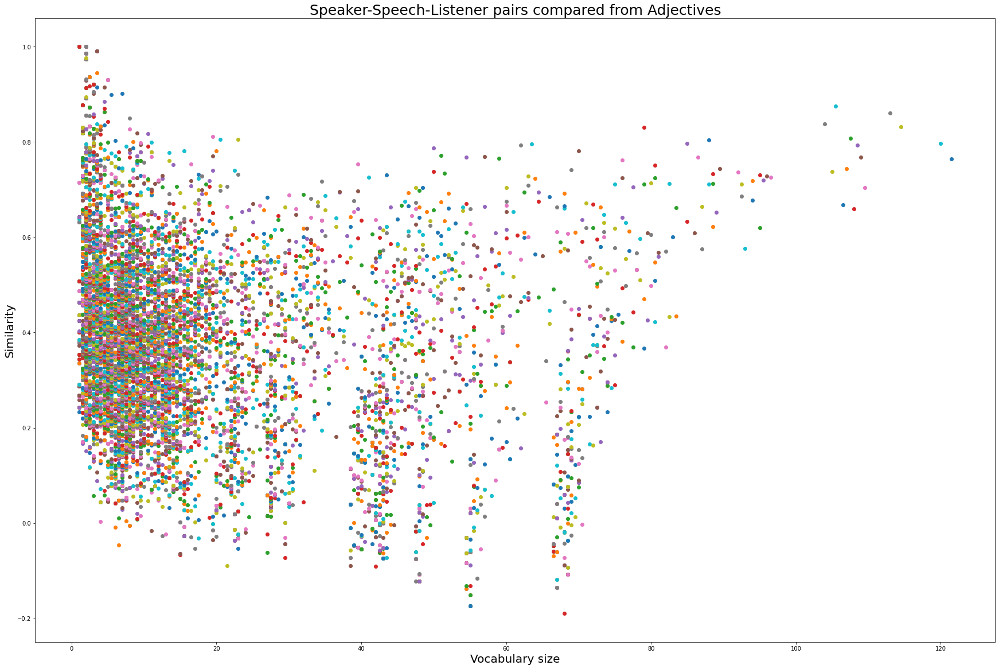

In [314]:
plt.figure(figsize=(30, 20))
for i in adj_new_list:
    plt.scatter(i[1][1],i[1][0])
plt.title("Speaker-Speech-Listener pairs compared from Adjectives", fontsize=25)
plt.xlabel("Vocabulary size", fontsize=20)
plt.ylabel("Similarity", fontsize=20)
plt.show()

In [337]:
for i in adj_new_list:
    if (i[1][1] <80 and i[1][1] >75 and i[1][0] >0.8):
        print(i)

('우진_대수_올드보이/정환_정은_가족', [0.83052874, 79.0])


In [338]:
print(collections.Counter(Adjectives['정환_정은_가족'].split(" ")).most_common())
print(collections.Counter(Adjectives['우진_대수_올드보이'].split(" ")).most_common())

[('좋', 3), ('싫', 3), ('재미없', 2), ('그렇', 2), ('아프', 2), ('예뻐졌', 1), ('쉽', 1), ('그래', 1), ('많', 1), ('밝', 1), ('똑같', 1), ('멋있', 1), ('재밌', 1), ('간지러워', 1), ('길', 1), ('이래', 1), ('짜', 1), ('같', 1), ('어때', 1), ('아파', 1), ('아퍼', 1)]
[('같', 4), ('괜찮', 2), ('그렇', 2), ('짧', 1), ('상관없', 1), ('힘세', 1), ('약하', 1), ('쉽', 1), ('외롭', 1), ('좋', 1), ('어떨까', 1), ('많', 1), ('싱거운', 1), ('하찮', 1), ('귀찮', 1), ('재미없', 1), ('재밌', 1), ('재미있', 1), ('뛰어난', 1), ('쉬운', 1), ('어떻', 1), ('미워할', 1), ('그럴', 1)]


In [293]:
adv_new_list = []
adv_res = sorted(adv_sim.items(), key=(lambda x: x[1][0]))
for i in adv_res:
    if (i[0][i[0].index('/')-1] != i[0][-1]):
        adv_new_list.append(i)

In [294]:
adv_new_list = sorted(adv_new_list, key=(lambda x: x[1][1]))

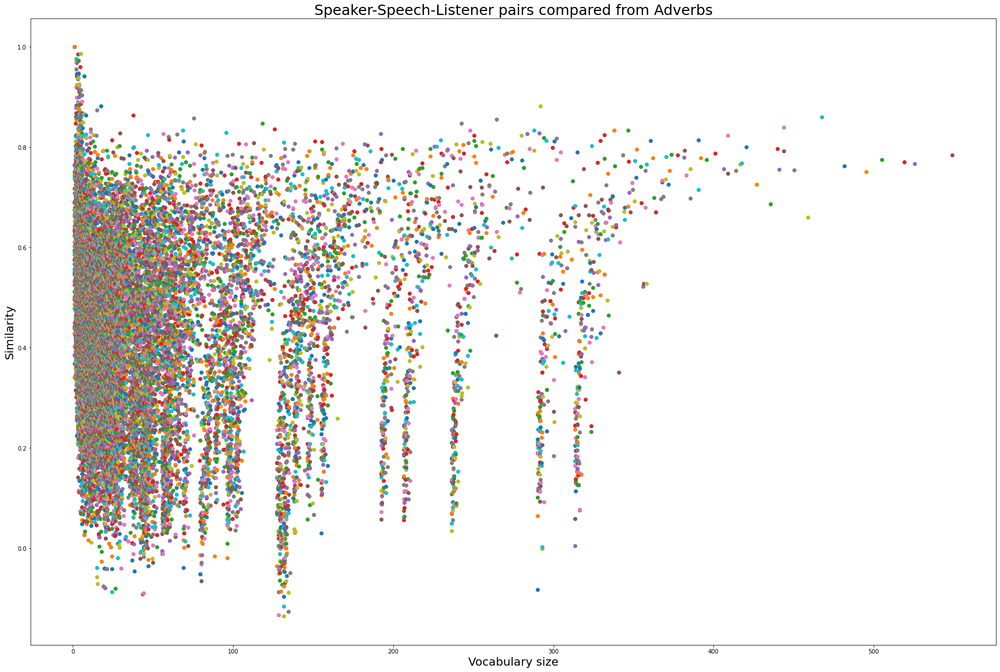

In [315]:
plt.figure(figsize=(30, 20))
for i in adv_new_list:
    plt.scatter(i[1][1],i[1][0])
plt.title("Speaker-Speech-Listener pairs compared from Adverbs", fontsize=25)
plt.xlabel("Vocabulary size", fontsize=20)
plt.ylabel("Similarity", fontsize=20)
plt.show()

In [302]:
len(adj_new_list)

11111

In [318]:
for i in adv_new_list:
    if (i[1][1] <300 and i[1][1] >250 and i[1][0] >0.8):
        print(i)

('우진_대수_올드보이/주석_정은_가족', [0.812942, 250.5])
('정원_다림_8월의 크리스마스/우진_대수_올드보이', [0.8229303, 250.5])
('도형_근찬_남극일기/민자_시은_각설탕', [0.80182093, 251.5])
('도형_근찬_남극일기/철수_김사장_내 머리 속의 지우개', [0.8097792, 255.5])
('희봉_강두_괴물/도형_근찬_남극일기', [0.8069676, 260.5])
('다림_정원_8월의 크리스마스/미도_대수_올드보이', [0.85555404, 264.5])
('도형_근찬_남극일기/정은_주석_가족', [0.82356095, 280.0])
('다림_정원_8월의 크리스마스/김수혁_강은표_고지전', [0.8260116, 283.5])
('도형_근찬_남극일기/주석_정은_가족', [0.83359575, 288.0])
('도형_민재_남극일기/시은_천둥_각설탕', [0.8277459, 291.0])
('다림_정원_8월의 크리스마스/우진_대수_올드보이', [0.88135713, 292.0])
('도형_영민_남극일기/정은_주석_가족', [0.8189127, 294.0])
('도형_민재_남극일기/민자_시은_각설탕', [0.81207734, 295.5])


In [321]:
import collections

In [329]:
print(collections.Counter(Adverbs['다림_정원_8월의 크리스마스'].split(" ")).most_common())
print(collections.Counter(Adverbs['우진_대수_올드보이'].split(" ")).most_common())

[('안', 10), ('왜', 5), ('그냥', 5), ('잘', 4), ('좀', 4), ('다', 4), ('그런', 3), ('이', 3), ('이런', 3), ('그렇게', 3), ('빨리', 2), ('너무', 2), ('정말', 2), ('어떻게', 2), ('이제', 2), ('못', 2), ('근데', 2), ('아직', 2), ('이렇게', 2), ('꼭', 2), ('잘못', 1), ('한참', 1), ('얼마나', 1), ('굉장히', 1), ('몇', 1), ('완전히', 1), ('그런데', 1), ('또', 1), ('아무', 1), ('한번', 1), ('제대로', 1), ('어느', 1), ('오늘', 1), ('늘', 1), ('겨우', 1), ('많이', 1), ('똑같이', 1), ('후다닥', 1), ('내', 1), ('저', 1), ('같이', 1), ('뜻대로', 1), ('별', 1), ('아둥바둥', 1), ('참', 1), ('맨', 1), ('이따가', 1), ('어제', 1), ('혹시', 1), ('처음', 1), ('언제', 1), ('한', 1), ('벌써', 1), ('역시', 1), ('직접', 1), ('갑자기', 1)]
[('왜', 10), ('그', 10), ('못', 6), ('잘', 5), ('그냥', 5), ('다시', 4), ('또', 3), ('하지만', 3), ('안', 3), ('한', 3), ('다', 3), ('너무', 3), ('이', 2), ('먼저', 2), ('아무튼', 2), ('아마', 2), ('정말', 2), ('여태', 2), ('진짜', 2), ('점점', 2), ('물론', 2), ('어떤', 2), ('다른', 1), ('이제', 1), ('빨리', 1), ('좀', 1), ('그럼', 1), ('스스로', 1), ('그리고', 1), ('모든', 1), ('역시', 1), ('근데', 1), ('그래도', 1), ('더', 1), ('그렇게', 1), (

In [300]:
len(adv_new_list)

25486

In [239]:
res = sorted(adv_sim.items(), key=(lambda x: x[1]))
for i in res:
    if i[0][i[0].index('/')-1] != i[0][-1]:
        print(i)

('정원_권투선수청년_8월의 크리스마스/희봉_남주_괴물', -0.13615)
('희봉_남주_괴물/수진_경찰1_내 머리 속의 지우개', -0.13326135)
('정원_권투선수청년_8월의 크리스마스/희봉_남일_괴물', -0.12613812)
('희봉_남일_괴물/수진_경찰1_내 머리 속의 지우개', -0.116596825)
('김수혁_self_고지전/희봉_남주_괴물', -0.096514255)
('철이_민자_각설탕/대수_순경_올드보이', -0.09158022)
('철이_민자_각설탕/대수_self_올드보이', -0.08959928)
('김수혁_self_고지전/희봉_남일_괴물', -0.08901169)
('희봉_남주_괴물/주석_손님_가족', -0.08751606)
('강두_남일_괴물/철이_민자_각설탕', -0.08725845)
('희봉_남주_괴물/리_일동_다찌마와 Lee', -0.086480305)
('철이_민자_각설탕/철수_수진_내 머리 속의 지우개', -0.08275712)
('강두_남주_괴물/철이_민자_각설탕', -0.08071778)
('남주_희봉_괴물/수진_노가다들_내 머리 속의 지우개', -0.07909462)
('남주_남일_괴물/수진_노가다들_내 머리 속의 지우개', -0.07909462)
('남주_강두_괴물/익두_장군_각설탕', -0.07627775)
('희봉_남일_괴물/주석_손님_가족', -0.07618317)
('민재_성훈_남극일기/희봉_남주_괴물', -0.072550766)
('남주_강두_괴물/수진_노가다들_내 머리 속의 지우개', -0.07117162)
('희봉_남주_괴물/익두_장군_각설탕', -0.06876226)
('수진_사수_내 머리 속의 지우개/정환_정은_가족', -0.066157915)
('희봉_남일_괴물/리_일동_다찌마와 Lee', -0.06552923)
('희봉_남주_괴물/수진_노가다들_내 머리 속의 지우개', -0.06411202)
('남주_강두_괴물/철이_민자_각설탕', -0.057012707)
('민재_성훈_남극일기/희봉_남일_

('김조교사_윤조교사_각설탕/대수_대수딸_올드보이', 0.23966727)
('김수혁_오기영_고지전/대수_우진_올드보이', 0.23968768)
('충녀_와싱톤_다찌마와 Lee/김조교사_철이_각설탕', 0.23976943)
('시은_마천복_각설탕/대수_자살남_올드보이', 0.23978259)
('김수혁_전원_고지전/정환_self_가족', 0.2398078)
('현서_희봉_괴물/판돌_장군_각설탕', 0.23982644)
('강은표_김종실_고지전/리_와싱톤_다찌마와 Lee', 0.2398612)
('김수혁_남성식_고지전/리_화녀_다찌마와 Lee', 0.2398768)
('남일_강두_괴물/대수_교사_올드보이', 0.2399121)
('현서_강두_괴물/민자_self_각설탕', 0.23992527)
('정원_정원아버지_8월의 크리스마스/시은_self_각설탕', 0.23996896)
('판돌_장군_각설탕/정환_주석_가족', 0.24002632)
('민재_성훈_남극일기/철수_박전무_내 머리 속의 지우개', 0.24004768)
('대수_순경_올드보이/철수_노가다들_내 머리 속의 지우개', 0.24005537)
('김수혁_유재홍_고지전/익두_황노인_각설탕', 0.24014215)
('강두_순경_괴물/대수_조직배들_올드보이', 0.24030527)
('시은_윤조교사_각설탕/철수_노가다들_내 머리 속의 지우개', 0.24032944)
('철수_사수_내 머리 속의 지우개/정은_주석_가족', 0.24033417)
('시은_민자_각설탕/정환_창원_가족', 0.24033949)
('리_와싱톤_다찌마와 Lee/수진_사수_내 머리 속의 지우개', 0.24035503)
('현서_희봉_괴물/주석_만식_가족', 0.24036242)
('현서_희봉_괴물/주석_친구들_가족', 0.24036242)
('리_회장_다찌마와 Lee/수진_유리_내 머리 속의 지우개', 0.24037547)
('남일_희봉_괴물/충녀_전원_다찌마와 Lee', 0.24038047)
('다림_self_8월의 크리스마스/리_충녀_

('강은표_최대령_고지전/남일_장씨_괴물', 0.33690944)
('남일_시위자들_괴물/정은_주인_가족', 0.3369311)
('시은_장한성마주_각설탕/대수_대수딸_올드보이', 0.33696193)
('희봉_강두_괴물/김수혁_신일영_고지전', 0.3369855)
('김수혁_강은표_고지전/대수_수녀_올드보이', 0.3370545)
('김수혁_남성식_고지전/대수_미도_올드보이', 0.3370923)
('도형_영민_남극일기/주석_창원_가족', 0.33711374)
('리_일동_다찌마와 Lee/정은_self_가족', 0.3371336)
('김조교사_창섭_각설탕/리_화녀_다찌마와 Lee', 0.33716965)
('시은_장군_각설탕/철수_간호사_내 머리 속의 지우개', 0.33717516)
('리_박_다찌마와 Lee/민자_마천복_각설탕', 0.33718774)
('리_ 와싱톤_다찌마와 Lee/민자_마천복_각설탕', 0.33718774)
('희봉_강두_괴물/판돌_self_각설탕', 0.33722898)
('희봉_장씨_괴물/김수혁_인민군_고지전', 0.33726147)
('강두_의료진들_괴물/시은_장한성마주_각설탕', 0.3372631)
('김수혁_장교_고지전/철수_사수_내 머리 속의 지우개', 0.337284)
('민자_시은_각설탕/대수_철웅_올드보이', 0.33730406)
('정원_self_8월의 크리스마스/정은_병천_가족', 0.33731675)
('강은표_ 김수혁_고지전/미도_주환_올드보이', 0.33731845)
('정원_중학생들_8월의 크리스마스/수진_남자모델_내 머리 속의 지우개', 0.33732465)
('정원_중학생들_8월의 크리스마스/수진_사진작가_내 머리 속의 지우개', 0.33732465)
('김수혁_신일영_고지전/화녀_리_다찌마와 Lee', 0.3373844)
('철수_공무원_내 머리 속의 지우개/정은_주인_가족', 0.33741215)
('현서_희봉_괴물/정은_교도관_가족', 0.33741367)
('철이_시은_각설탕/철수_윤아_내 머리 속의

('김조교사_장한성마주_각설탕/주석_만식_가족', 0.42113313)
('김조교사_장한성마주_각설탕/주석_친구들_가족', 0.42113313)
('정원_다림_8월의 크리스마스/대수_철가방_올드보이', 0.42115548)
('강두_희봉_괴물/시은_장군_각설탕', 0.4211624)
('강은표_신일영_고지전/미도_대수_올드보이', 0.42118534)
('정원_뚱뚱한 30대 여자_8월의 크리스마스/주석_만식_가족', 0.42119566)
('정원_뚱뚱한 30대 여자_8월의 크리스마스/주석_친구들_가족', 0.42119566)
('남일_노숙자_괴물/김조교사_철이_각설탕', 0.42120427)
('대수_self_올드보이/주석_동수_가족', 0.42120895)
('정원_정숙_8월의 크리스마스/시은_민자_각설탕', 0.42125857)
('강은표_최대령_고지전/김조교사_윤조교사_각설탕', 0.42127886)
('남일_self_괴물/민자_마천복_각설탕', 0.42128512)
('충녀_와싱톤_다찌마와 Lee/철수_남자들_내 머리 속의 지우개', 0.42128843)
('시은_윤조교사_각설탕/철수_운전수2_내 머리 속의 지우개', 0.42129716)
('도형_민재_남극일기/현서_강두_괴물', 0.42132625)
('정원_지원_8월의 크리스마스/충녀_박_다찌마와 Lee', 0.42135412)
('정원_지원_8월의 크리스마스/충녀_ 와싱톤_다찌마와 Lee', 0.42135412)
('현서_강두_괴물/정환_창원_가족', 0.42139274)
('정원_민구_8월의 크리스마스/민재_self_남극일기', 0.42141223)
('시은_동기생1_각설탕/우진_경호실장_올드보이', 0.42142126)
('시은_동기생2_각설탕/우진_경호실장_올드보이', 0.42142126)
('대수_간수_올드보이/수진_철수_내 머리 속의 지우개', 0.42142966)
('남일_self_괴물/시은_민자_각설탕', 0.42143065)
('대수_형자_올드보이/철수_김사장_내 머리 속의 지우개'

('희봉_self_괴물/시은_유도원_각설탕', 0.49950865)
('정원_중학생들_8월의 크리스마스/김조교사_창섭_각설탕', 0.499525)
('강은표_ 김수혁_고지전/시은_선배1_각설탕', 0.4995391)
('시은_민자_각설탕/정은_창원_가족', 0.49955)
('강은표_현정윤_고지전/수진_김사장_내 머리 속의 지우개', 0.49957412)
('김수혁_유재홍_고지전/철수_이박사_내 머리 속의 지우개', 0.49961182)
('다림_정원_8월의 크리스마스/우진_경호실장_올드보이', 0.49964008)
('판돌_익두_각설탕/대수_형자_올드보이', 0.4997218)
('판돌_장군_각설탕/수진_차실장_내 머리 속의 지우개', 0.49972308)
('리_일동_다찌마와 Lee/수진_차실장_내 머리 속의 지우개', 0.49975172)
('정원_지원_8월의 크리스마스/도형_성훈_남극일기', 0.49978334)
('남일_self_괴물/시은_마천복_각설탕', 0.4997897)
('시은_망아지_각설탕/철수_김사장_내 머리 속의 지우개', 0.49980274)
('김수혁_유재홍_고지전/현서_강두_괴물', 0.4998389)
('다림_효정_8월의 크리스마스/익두_중계상_각설탕', 0.4998471)
('정원_철구_8월의 크리스마스/철수_노가다들_내 머리 속의 지우개', 0.49989572)
('시은_철이_각설탕/정은_관찰관_가족', 0.4999161)
('화녀_리_다찌마와 Lee/정은_정환_가족', 0.49995127)
('시은_익두_각설탕/대수_형자_올드보이', 0.49995953)
('남일_노숙자_괴물/김수혁_신일영_고지전', 0.4999788)
('시은_김조교사_각설탕/대수_self_올드보이', 0.4999841)
('도형_성훈_남극일기/남일_순경_괴물', 0.50001645)
('강두_순경들_괴물/수진_유리_내 머리 속의 지우개', 0.5000253)
('민재_도형_남극일기/김수혁_오기영_고지전', 0.5000518)
('수진_철수_내 머리 속의 지

('판돌_천둥_각설탕/정환_self_가족', 0.58560604)
('철수_용준_내 머리 속의 지우개/정환_self_가족', 0.58560604)
('김조교사_창섭_각설탕/수진_경찰1_내 머리 속의 지우개', 0.58560646)
('다림_정원_8월의 크리스마스/남일_희봉_괴물', 0.5856123)
('남일_남주_괴물/정은_주석_가족', 0.5856199)
('대수_주환_올드보이/주석_정환_가족', 0.5856216)
('강은표_양효삼_고지전/판돌_self_각설탕', 0.58565694)
('남일_노숙다_괴물/철수_노숙자_내 머리 속의 지우개', 0.58572525)
('김조교사_시은_각설탕/수진_김사장_내 머리 속의 지우개', 0.5857605)
('시은_민자_각설탕/철수_수진_내 머리 속의 지우개', 0.5858553)
('강두_현서_괴물/시은_장군_각설탕', 0.58586365)
('김수혁_강은표_고지전/시은_김조교사_각설탕', 0.5858645)
('시은_장군_각설탕/철수_self_내 머리 속의 지우개', 0.58587855)
('김수혁_self_고지전/수진_안나 정_내 머리 속의 지우개', 0.5859154)
('김수혁_현정윤_고지전/정원_민구_8월의 크리스마스', 0.58600324)
('김조교사_시은_각설탕/대수_주환_올드보이', 0.5860095)
('남일_순경_괴물/주석_정환_가족', 0.5860314)
('남일_self_괴물/정은_self_가족', 0.58605826)
('강은표_오기영_고지전/익두_판돌_각설탕', 0.586079)
('강두_세주_괴물/수진_지현_내 머리 속의 지우개', 0.5861149)
('강두_세주_괴물/수진_명주_내 머리 속의 지우개', 0.5861149)
('다림_효정_8월의 크리스마스/우진_self_올드보이', 0.58615166)
('강두_세주_괴물/수진_김사장_내 머리 속의 지우개', 0.5861742)
('희봉_현서_괴물/수진_김사장_내 머리 속의 지우개', 0.58618975)
('익두_장군_각설탕/주석_손

('대수_수아_올드보이/정환_병천_가족', 0.7673697)
('민재_유진_남극일기/남일_노숙다_괴물', 0.7674613)
('도형_근찬_남극일기/강두_남주_괴물', 0.76757234)
('민재_재경_남극일기/시은_황노인_각설탕', 0.76758105)
('민재_근찬_남극일기/김수혁_전원_고지전', 0.7677273)
('익두_천둥_각설탕/대수_형자_올드보이', 0.7679188)
('도형_재경_남극일기/주석_정환_가족', 0.76864463)
('정원_self_8월의 크리스마스/우진_self_올드보이', 0.768673)
('우진_self_올드보이/정환_병천_가족', 0.768673)
('김수혁_self_고지전/철수_공무원_내 머리 속의 지우개', 0.76869214)
('도형_영민_남극일기/철수_박전무_내 머리 속의 지우개', 0.7688437)
('강두_의사_괴물/리_일동_다찌마와 Lee', 0.76908916)
('강두_희봉_괴물/철수_김사장_내 머리 속의 지우개', 0.7692079)
('대수_미도_올드보이/철수_수진_내 머리 속의 지우개', 0.76929235)
('대수_대수딸_올드보이/철수_사수_내 머리 속의 지우개', 0.7692973)
('시은_천둥_각설탕/정환_정은_가족', 0.7695895)
('익두_판돌_각설탕/철수_노과장_내 머리 속의 지우개', 0.76967084)
('정원_다림_8월의 크리스마스/강은표_김수혁_고지전', 0.76989686)
('도형_영민_남극일기/수진_철수_내 머리 속의 지우개', 0.7699705)
('강은표_김수혁_고지전/강두_남주_괴물', 0.7700735)
('강은표_self_고지전/철수_공무원_내 머리 속의 지우개', 0.77011317)
('희봉_의사_괴물/철수_윤아_내 머리 속의 지우개', 0.77015734)
('희봉_간호사_괴물/철수_윤아_내 머리 속의 지우개', 0.77015734)
('김수혁_남성식_고지전/익두_천둥_각설탕', 0.7704285)
('강두_남일_괴물/정은_주석_가족', 0.7